In [ ]:
import seaborn as sns
import numpy as np
import pandas as pd 
from matplotlib import pyplot as plt
import plotly.express as px
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_squared_error, mean_absolute_error,mean_squared_log_error
from scipy.optimize import curve_fit

import statsmodels.api as sm
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.stattools import adfuller
from scipy.stats import normaltest,norm

import tensorflow as tf
from sklearn.preprocessing import MinMaxScaler
from IPython.display import HTML
def hide_toggle():
    return HTML('''<script>
        code_show=true; 
        function code_toggle() {
         if (code_show){
     $('div.input').hide();
     } else {
     $('div.input').show();
     }
     code_show = !code_show
    } 
    $( document ).ready(code_toggle);
    </script>
    <form action="javascript:code_toggle()"><input type="submit" value="show code."></form>''')

<center><h1>Time Series</h1></center> 
before we jump into the EDA and the modeling&forecasting parts, let us understand what is the meaning of time series.

so what is a time series? well, time series is just a sequence of observations over regular inervals of time, each observation is called a lag.

time series can be yearly, monthly, daily, hourly and so on.

there are two main steps that we want to do when we working with time series:
1. analysis - basic EDA, correlations, sesonarity and etc. this step is crucial for the modeling and forecasting step.
2. forecasting - forecast future values (lags) given past values.
   this step is very helpful when dealing with stocks, sales and even deseasis ,
   with good predication  we can plan the future.

in this notebook we have made a basic EDA and we have tried 4 different algorihtms for forecasting:
1. classical statistical models: ARIMA.
2. classical machine learning models: linear polynomial regression.
3. deep learning: LSTM and CNN.

In [ ]:
hide_toggle()

In [ ]:
data = pd.read_csv("https://covid.ourworldindata.org/data/owid-covid-data.csv")
data.columns

Index(['iso_code', 'continent', 'location', 'date', 'total_cases', 'new_cases',
       'total_deaths', 'new_deaths', 'total_cases_per_million',
       'new_cases_per_million', 'total_deaths_per_million',
       'new_deaths_per_million', 'new_tests', 'total_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand', 'tests_units',
       'stringency_index', 'population', 'population_density', 'median_age',
       'aged_65_older', 'aged_70_older', 'gdp_per_capita', 'extreme_poverty',
       'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers',
       'male_smokers', 'handwashing_facilities', 'hospital_beds_per_thousand',
       'life_expectancy'],
      dtype='object')

<center><h1> Basic EDA<h1><center>
    <center><h2>World statistics<h2><center>   

<center><h3>Top 15 in Population (and density)<h3></center>

In [ ]:
def plot(x,y,data,title):
    plt.figure(figsize =(40,10))
    plt.rc('font', **{'weight' : 'bold','size'   : 22})
    sns.barplot(x=x, y=y, data=data)
    plt.xlabel('Country')
    plt.title(title)


location
China            1.439324e+09
India            1.380004e+09
United States    3.310026e+08
Indonesia        2.735236e+08
Pakistan         2.208923e+08
Brazil           2.125594e+08
Nigeria          2.061396e+08
Bangladesh       1.646894e+08
Russia           1.459345e+08
Mexico           1.289328e+08
Japan            1.264765e+08
Ethiopia         1.149636e+08
Philippines      1.095811e+08
Egypt            1.023344e+08
Vietnam          9.733858e+07
Name: population, dtype: float64

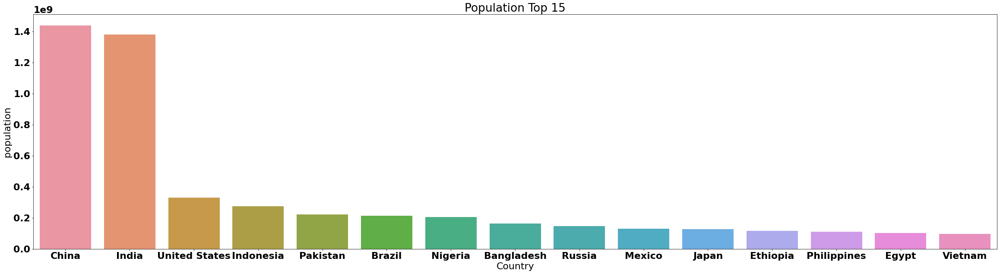

In [ ]:
pop = data.population.groupby(data.location).max().sort_values(ascending= False)
pop15 = pd.DataFrame({'population':pop.iloc[1:16],'location':pop.iloc[1:16].index})
plot(x="location",y="population",data=pop15,title="Population Top 15")
pop15["population"]

location
Monaco                       19347.500
Singapore                     7915.731
Hong Kong                     7039.714
Gibraltar                     3457.100
Bahrain                       1935.907
Maldives                      1454.433
Malta                         1454.037
Bermuda                       1308.820
Bangladesh                    1265.036
Sint Maarten (Dutch part)     1209.088
Palestine                      778.202
Barbados                       664.463
Mauritius                      622.962
Lebanon                        594.561
Aruba                          584.800
Name: population_density, dtype: float64

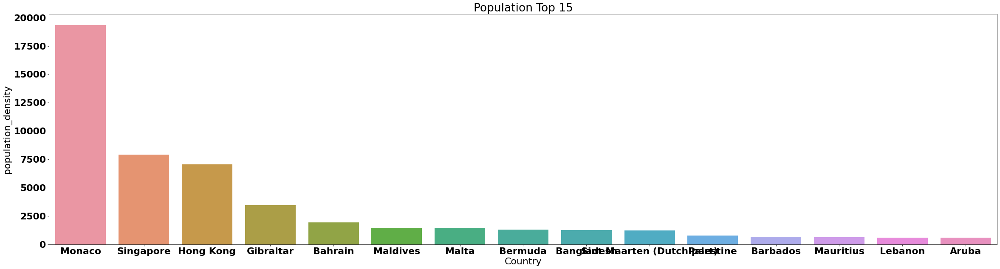

In [ ]:
pop = data.population_density.groupby(data.location).max().sort_values(ascending= False)
pop15 = pd.DataFrame({'population_density':pop.iloc[0:15],'location':pop.iloc[0:15].index})
plot(x="location",y="population_density",data=pop15,title="Population Top 15")
pop15["population_density"]

<center><h3>Top 15 in Confirmed Cases<h3></center>
 

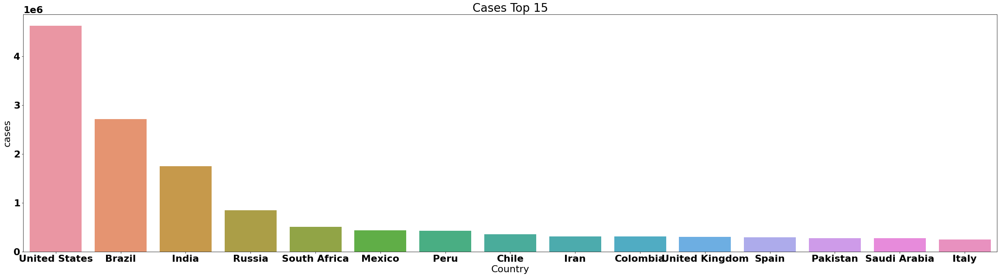

In [ ]:
total = data.new_cases.groupby(data.location).sum().sort_values(ascending= False)
tot15 = pd.DataFrame({'cases':total.iloc[1:16],'location':total.iloc[1:16].index})
plot(x="location",y="cases",data=tot15,title="Cases Top 15")

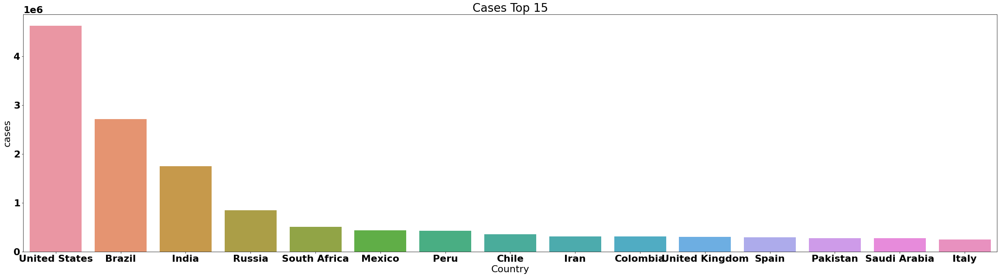

In [ ]:
total = data.total_cases.groupby(data.location).max().sort_values(ascending= False)
tot15 = pd.DataFrame({'cases':total.iloc[1:16],'location':total.iloc[1:16].index})
plot(x="location",y="cases",data=tot15,title="Cases Top 15")

<center><h3>Top 15 in Deaths<h3></center>

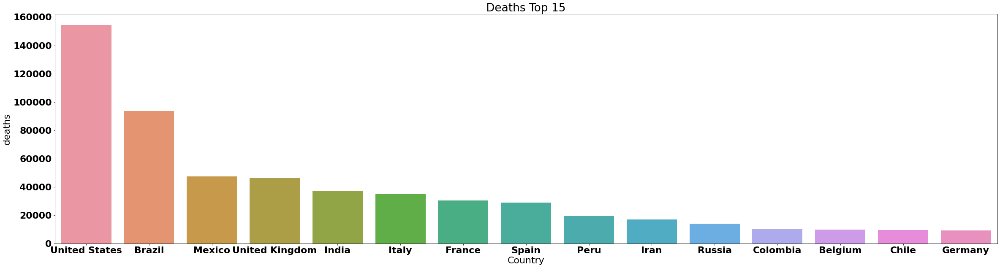

In [ ]:
total = data.total_deaths.groupby(data.location).max().sort_values(ascending= False)
tot15 = pd.DataFrame({'deaths':total.iloc[1:16],'location':total.iloc[1:16].index})
plot(x="location",y="deaths",data=tot15,title="Deaths Top 15")


## corelations


In [ ]:
corr_data = data[data.location!="World"]
params = ['total_cases_per_million', 'total_deaths_per_million', 
          'population_density', 'median_age',
          'hospital_beds_per_thousand', 'life_expectancy',
         'total_tests_per_thousand','handwashing_facilities'       
         ]

corr_matrix = corr_data.corr(method="spearman")#(method="pearson")
corr_matrix = corr_matrix[params].filter(params, axis = 0)
cm = sns.diverging_palette(20, 120, sep=5, as_cmap=True)
corr_matrix.style.background_gradient(cmap=cm)

 

,total_cases_per_million,total_deaths_per_million,population_density,median_age,hospital_beds_per_thousand,life_expectancy,total_tests_per_thousand,handwashing_facilities
total_cases_per_million,1.000000,0.821825,0.090319,0.238200,0.203663,0.302779,0.854329,0.154884
total_deaths_per_million,0.821825,1.000000,0.062610,0.243126,0.178588,0.250525,0.752286,0.137977
population_density,0.090319,0.062610,1.000000,0.201351,0.073791,0.284515,-0.015966,0.094684
median_age,0.238200,0.243126,0.201351,1.000000,0.762060,0.849199,0.406706,0.796859
hospital_beds_per_thousand,0.203663,0.178588,0.073791,0.762060,1.000000,0.556276,0.350091,0.534031
life_expectancy,0.302779,0.250525,0.284515,0.849199,0.556276,1.000000,0.441807,0.835157
total_tests_per_thousand,0.854329,0.752286,-0.015966,0.406706,0.350091,0.441807,1.000000,0.235523
handwashing_facilities,0.154884,0.137977,0.094684,0.796859,0.534031,0.835157,0.235523,1.000000


In [ ]:
def cases_over_time(loc,title,type):
    plt.figure(figsize= (50,50))
    plt.yticks(fontsize = 20)
    plt.xticks(rotation=90,size=15)
    plt.title(title , fontsize = 30)
    cases = data[data.location==loc].groupby('date')[['date', type]].sum().reset_index()
    cases['date'] = pd.to_datetime(cases['date'])
    ax = sns.pointplot( x = cases.date.dt.date ,y = cases[type])

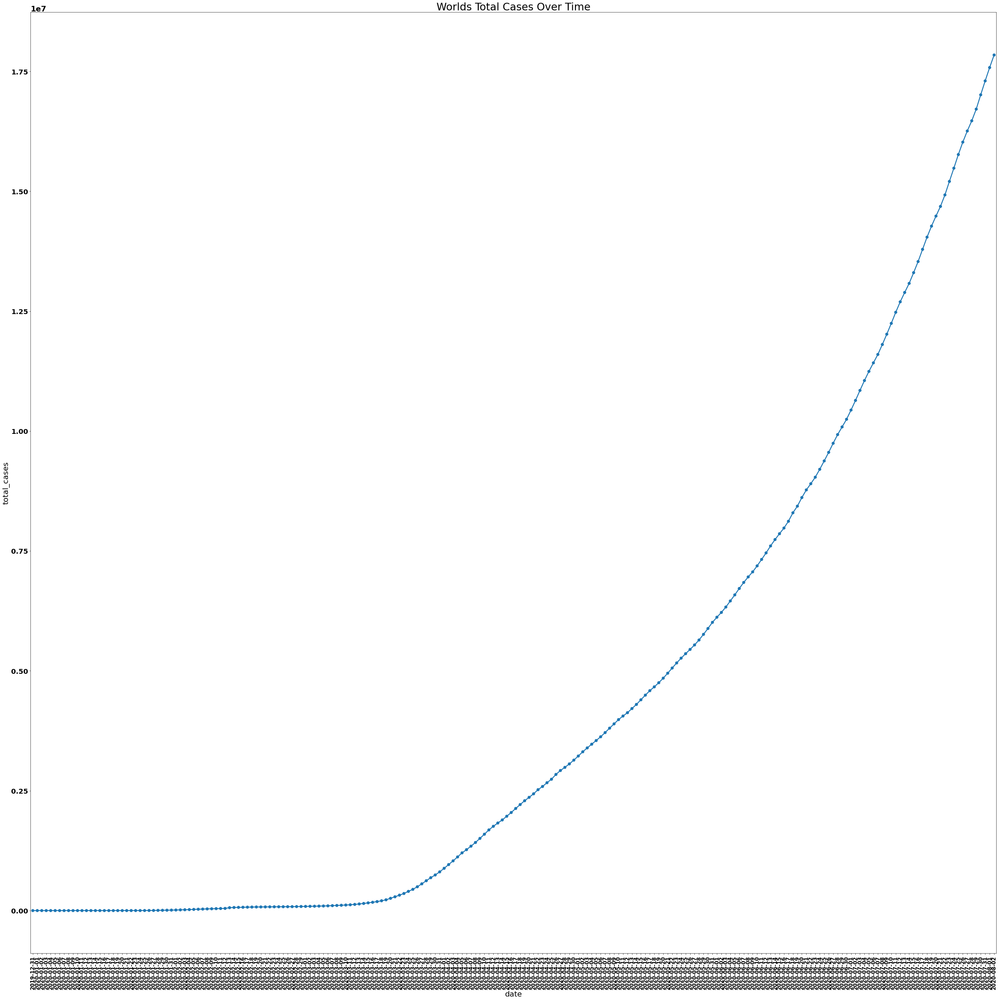

In [ ]:
cases_over_time(loc="World",title="Worlds Total Cases Over Time",type='total_cases')

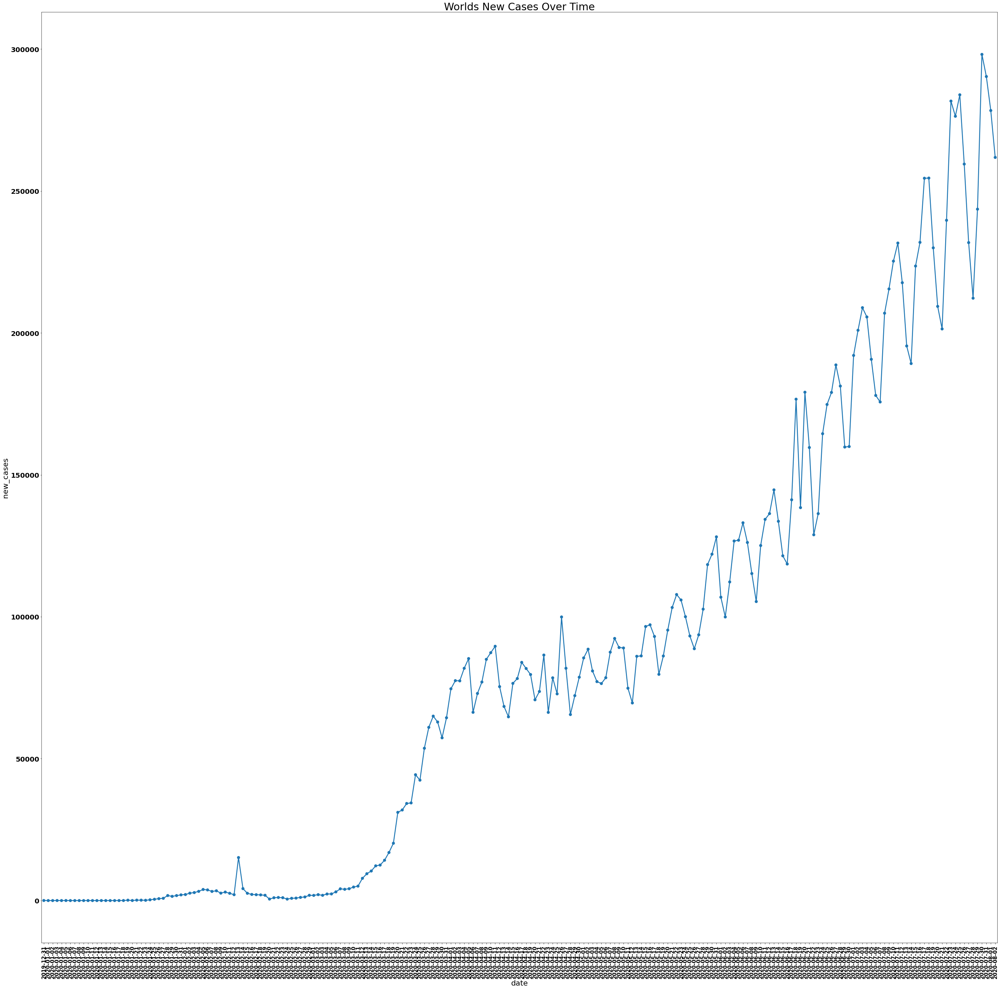

In [ ]:
cases_over_time(loc="World",title="Worlds New Cases Over Time",type='new_cases')

<center><h2>Specific countries statistics<h2><center>
<h4> let us look at the following countries:
        1. Israel
        2. USA
        3. China</h4>

In [ ]:
data = data[(data.location =="Israel") | (data.location == "United States")  | (data.location == "China")|(data.location == "World")].reset_index(drop=True)
data = data[["total_cases","new_cases","total_deaths","new_deaths","location","date"]]

<center><h3>Israel<h3></center>
<center><h4>Five number summary<h4></center>

In [ ]:
five_sum = lambda loc: data[data.location==loc].describe()
five_sum("Israel")

,total_cases,new_cases,total_deaths,new_deaths
count,213.000000,213.000000,213.000000,213.000000
mean,14224.798122,339.356808,160.319249,2.474178
std,17002.747580,546.716877,159.111897,3.516208
min,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.000000,0.000000,0.000000
50%,12982.000000,79.000000,151.000000,1.000000
75%,18268.000000,412.000000,299.000000,4.000000
max,72283.000000,2502.000000,527.000000,15.000000


<center><h3>Israel<h3></center>
<center><h4>Monthly Progression of the disease<h4></center>

In [ ]:
prog = lambda frame,range : [frame[frame.date<'2020-0{}-01'.format(m)].new_cases.sum() for m in range]
def progrees(frame,range=range(2,9)):
    plt.figure(figsize =(40,10))
    plt.rc('font', **{'weight' : 'bold','size'   : 22})
    months = prog(frame,range)
    sns.barplot(['upto Jan','Upto Feb','Upto Mar', 'Upto Apr','Upto May','Upto june','upto jul'],months)
    return months

[0.0, 7.0, 4473.0, 15834.0, 17012.0, 24441.0, 70379.0]

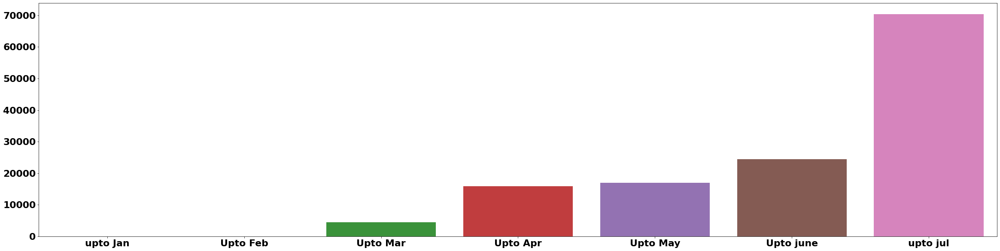

In [ ]:
progrees(data[data.location=="Israel"])

[0.0, 7.0, 4466.0, 11361.0, 1178.0, 7429.0, 45938.0]

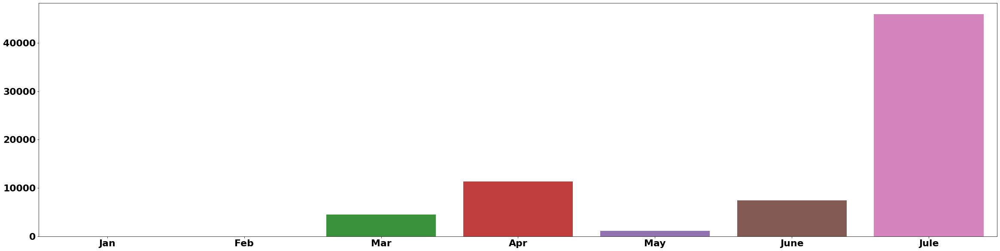

In [ ]:
def count_per_month(frame,range=range(2,9),labels=['Jan','Feb','Mar','Apr','May','June','Jule']):
    count = prog(frame,range)
    count = [c if i==0 else count[i]-count[i-1] for i,c in enumerate(count)]
    plt.figure(figsize =(40,10))
    plt.rc('font', **{'weight' : 'bold','size'   : 22})
    sns.barplot(labels,count)
    return count

count_per_month(data[data.location=="Israel"])

<center><h3>Israel<h3></center>
<center><h4>Daily stats<h4></center>

In [ ]:
def cases_per_day(loc,start_date,finish_date,title,type):
    fig = px.bar(data[(data.location ==loc) &(data.date >= start_date)&(data.date <= finish_date)].sort_values(type,ascending = False), 
             x='date', y=type, color=type)
    fig.update_layout(title_text=title)
    fig.show()

In [ ]:
cases_per_day(loc="Israel",start_date='2020-01-01',finish_date='2020-07-01',title='Confirmed COVID-19 cases per day in israel',type="total_cases")

In [ ]:
cases_per_day(loc="Israel",start_date='2020-01-01',finish_date='2020-07-01',title='Confirmed COVID-19(new)cases per day in israel',type="new_cases")

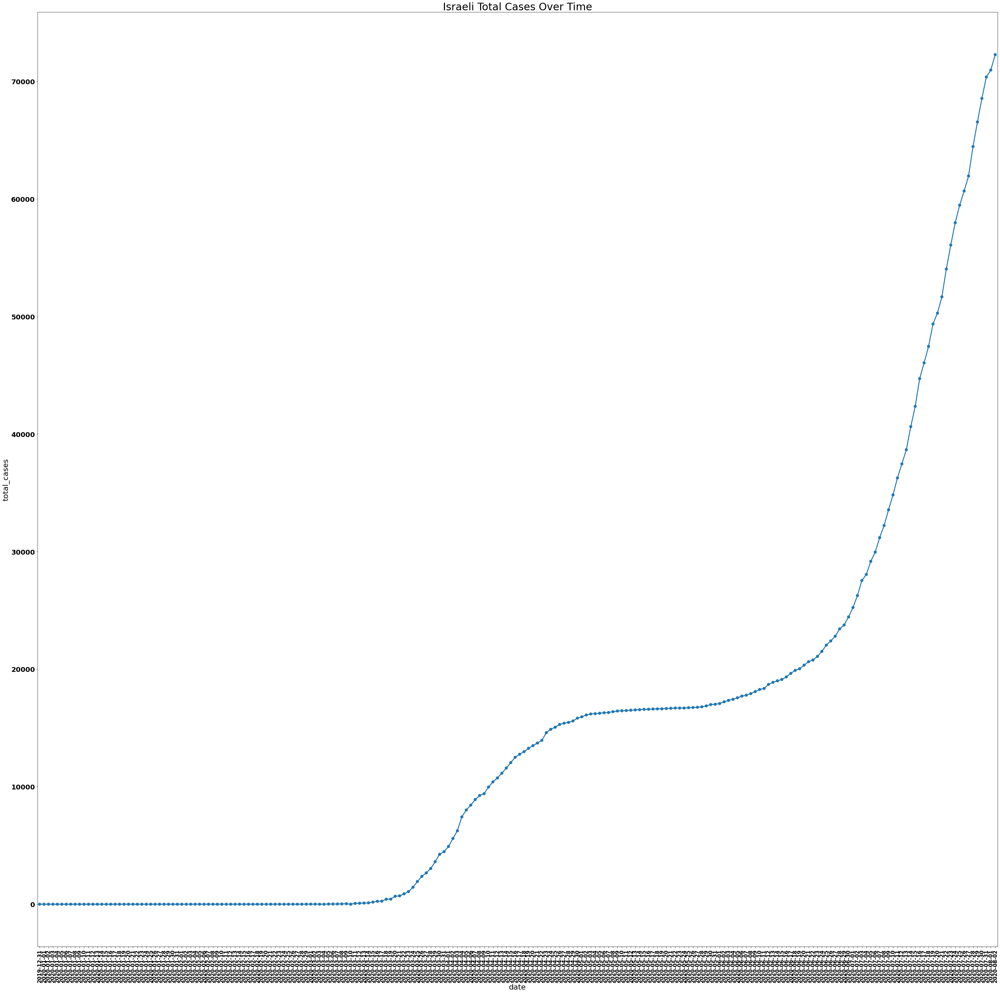

In [ ]:
cases_over_time(loc="Israel",title="Israeli Total Cases Over Time",type='total_cases')

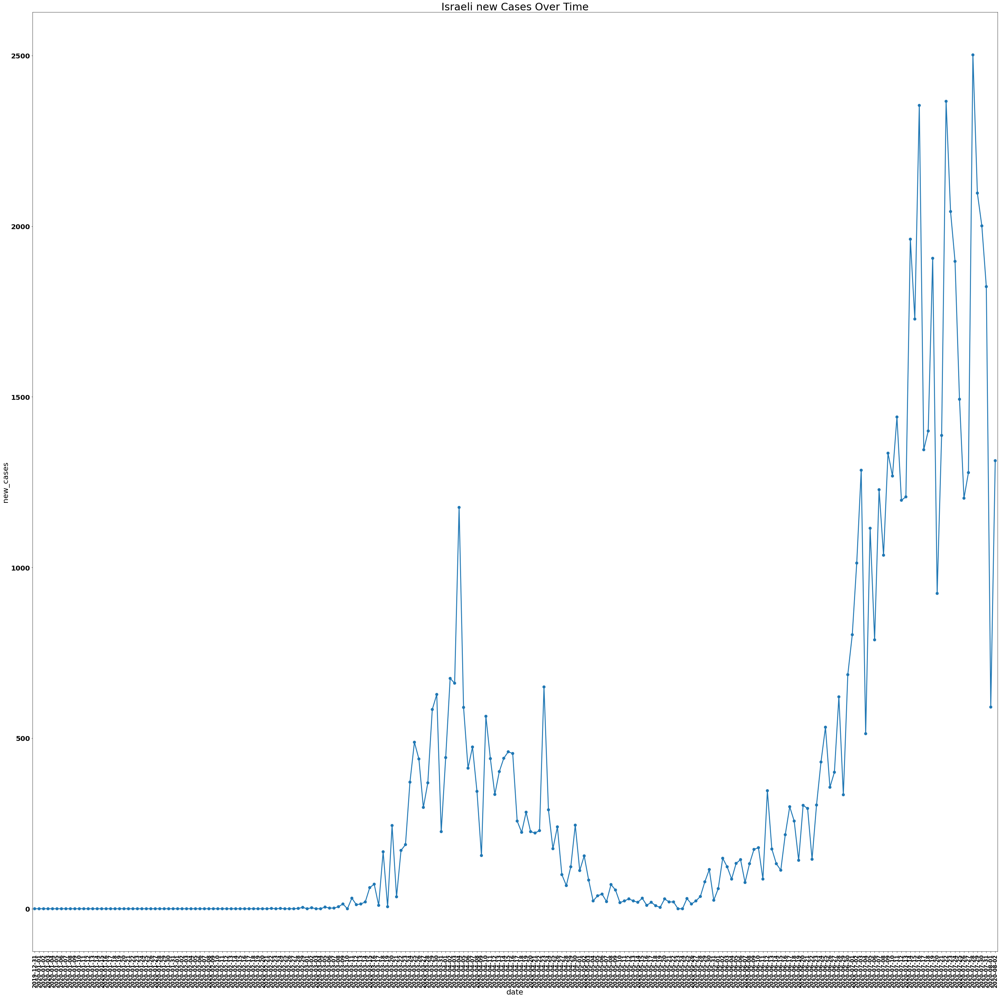

In [ ]:
cases_over_time(loc="Israel",title="Israeli new Cases Over Time",type='new_cases')

In [ ]:
cases_per_day(loc="Israel",start_date='2020-01-01',finish_date='2020-07-01',title='Confirmed COVID-19 deaths per day in israel',type="new_deaths")

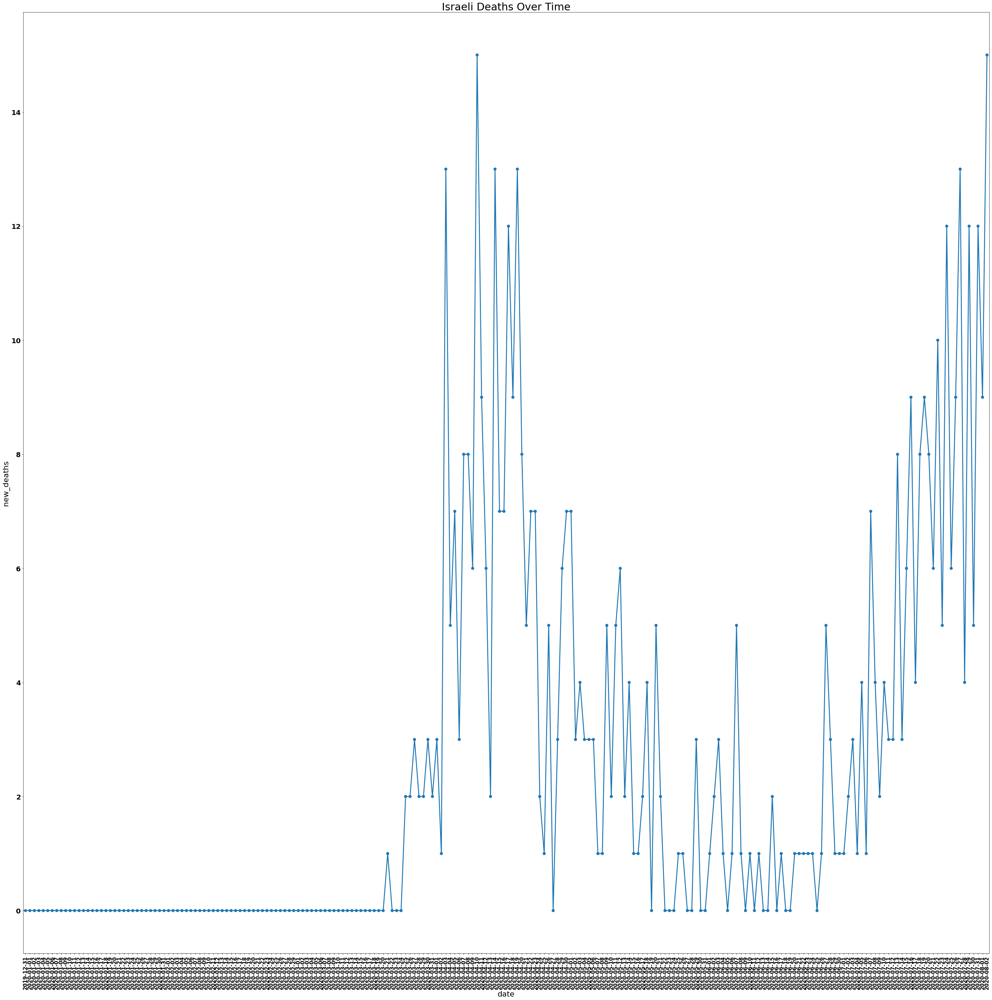

In [ ]:
cases_over_time(loc="Israel",title="Israeli Deaths Over Time",type='new_deaths')

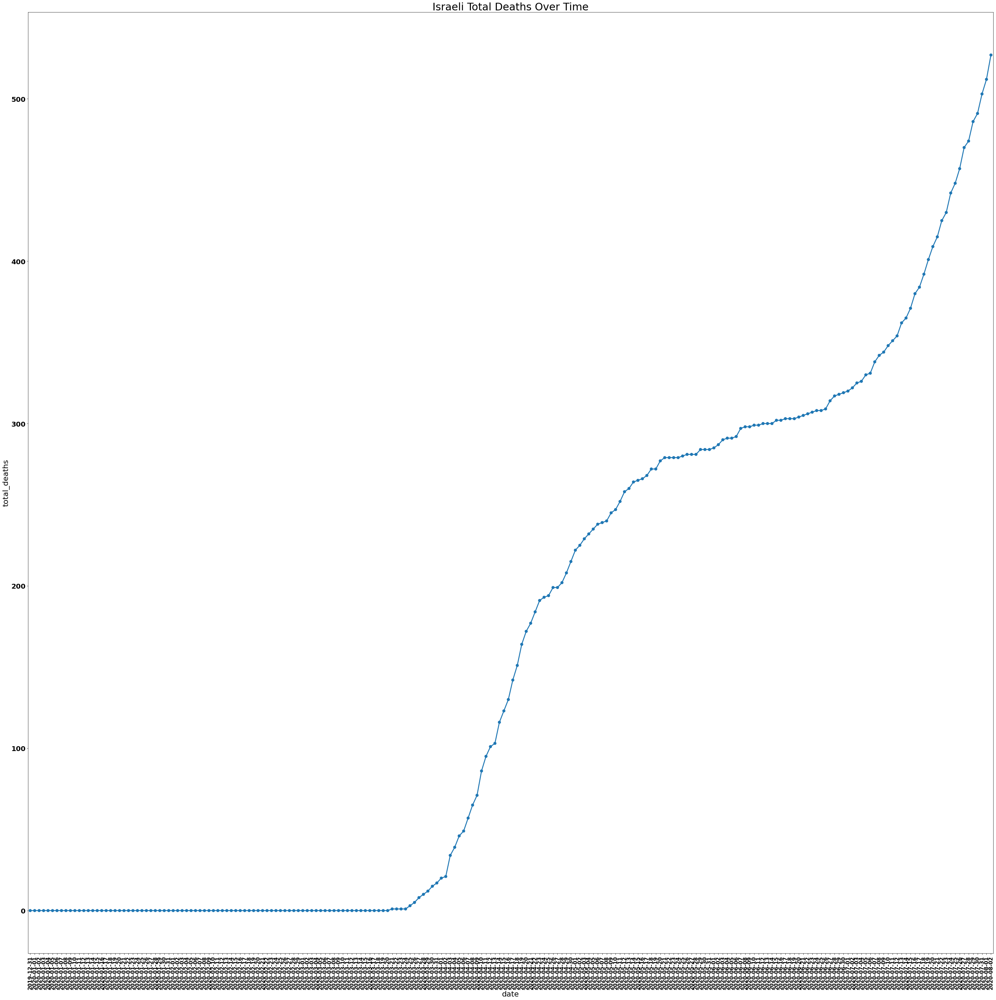

In [ ]:
cases_over_time(loc="Israel",title="Israeli Total Deaths Over Time",type='total_deaths')

<center><h3>USA<h3></center>
<center><h4>Five number summary<h4></center>

In [ ]:
five_sum(loc="United States")

,total_cases,new_cases,total_deaths,new_deaths
count,2.160000e+02,216.000000,216.000000,216.000000
mean,1.141687e+06,21390.944444,53886.916667,715.032407
std,1.316798e+06,21489.200516,56485.605359,804.915338
min,0.000000e+00,0.000000,0.000000,0.000000
25%,3.500000e+01,1.000000,0.000000,0.000000
50%,6.554975e+05,20698.000000,32134.500000,551.000000
75%,1.965851e+06,30574.000000,111256.750000,1163.500000
max,4.620444e+06,78427.000000,154447.000000,4928.000000


<center><h3>USA<h3></center>
<center><h4>Monthly Progression of the disease<h4></center>

[6.0, 66.0, 164620.0, 1039909.0, 1770384.0, 2590552.0, 4495014.0]

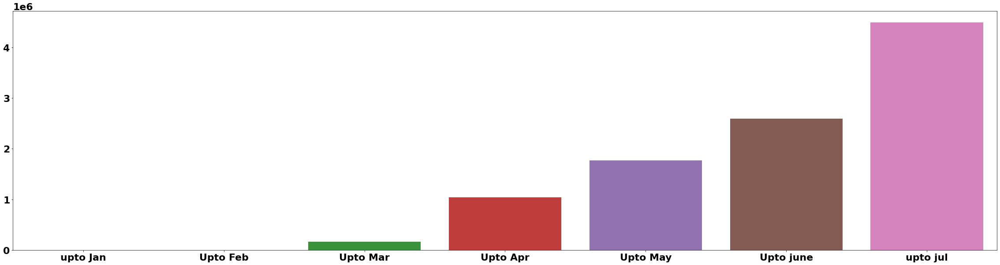

In [ ]:
progrees(data[data.location=="United States"])

[6.0, 60.0, 164554.0, 875289.0, 730475.0, 820168.0, 1904462.0]

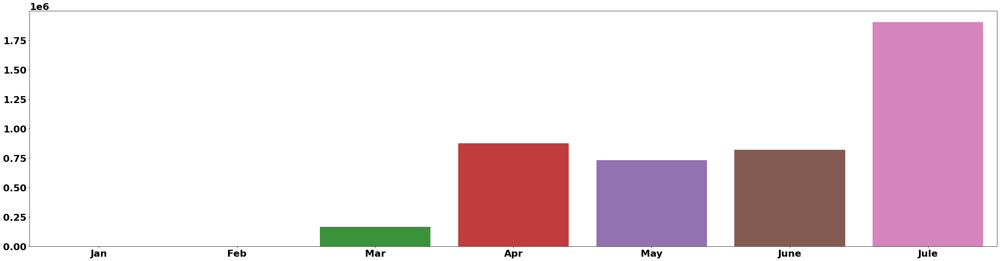

In [ ]:
count_per_month(data[data.location=="United States"])

<center><h3>USA<h3></center>
<center><h4>Daily stats<h4></center>

In [ ]:
cases_per_day(loc="United States",start_date='2020-01-01',finish_date='2020-07-01',title='Confirmed COVID-19 cases per day in usa',type="new_cases")

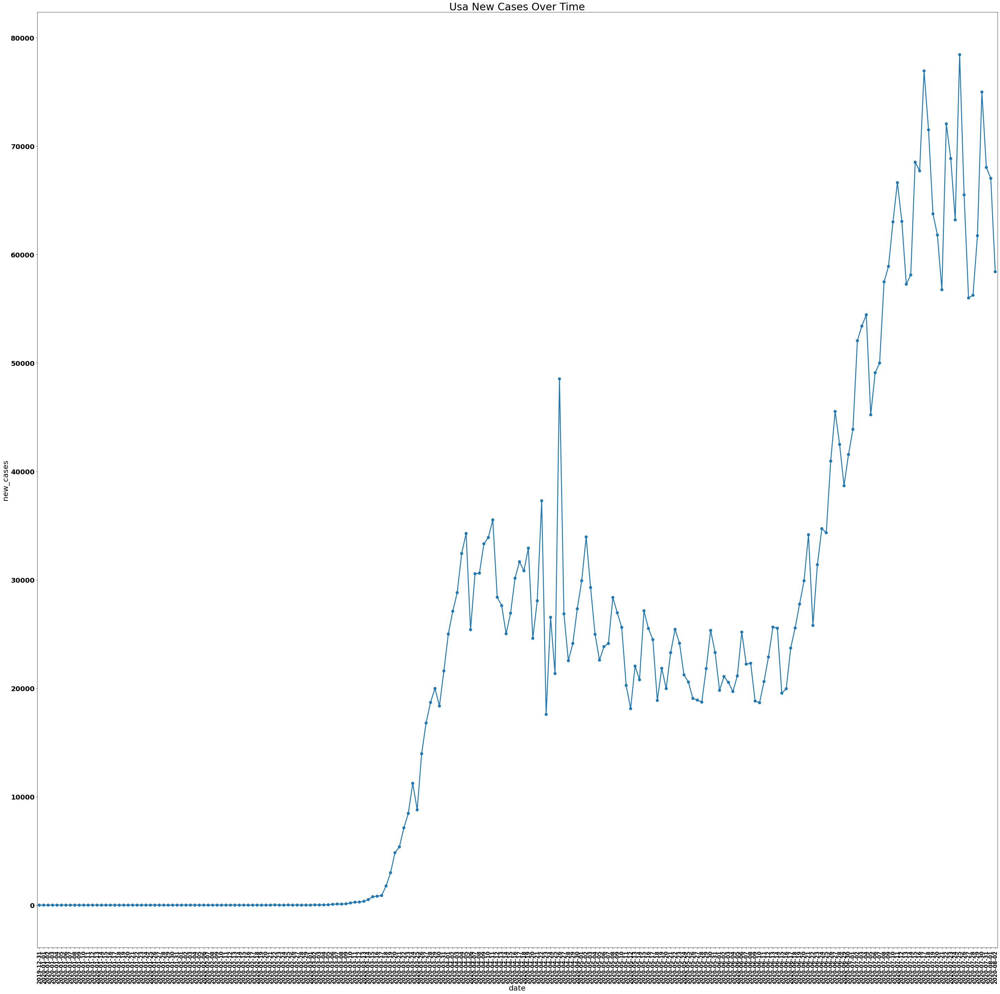

In [ ]:
cases_over_time(loc="United States",title="Usa New Cases Over Time",type='new_cases')

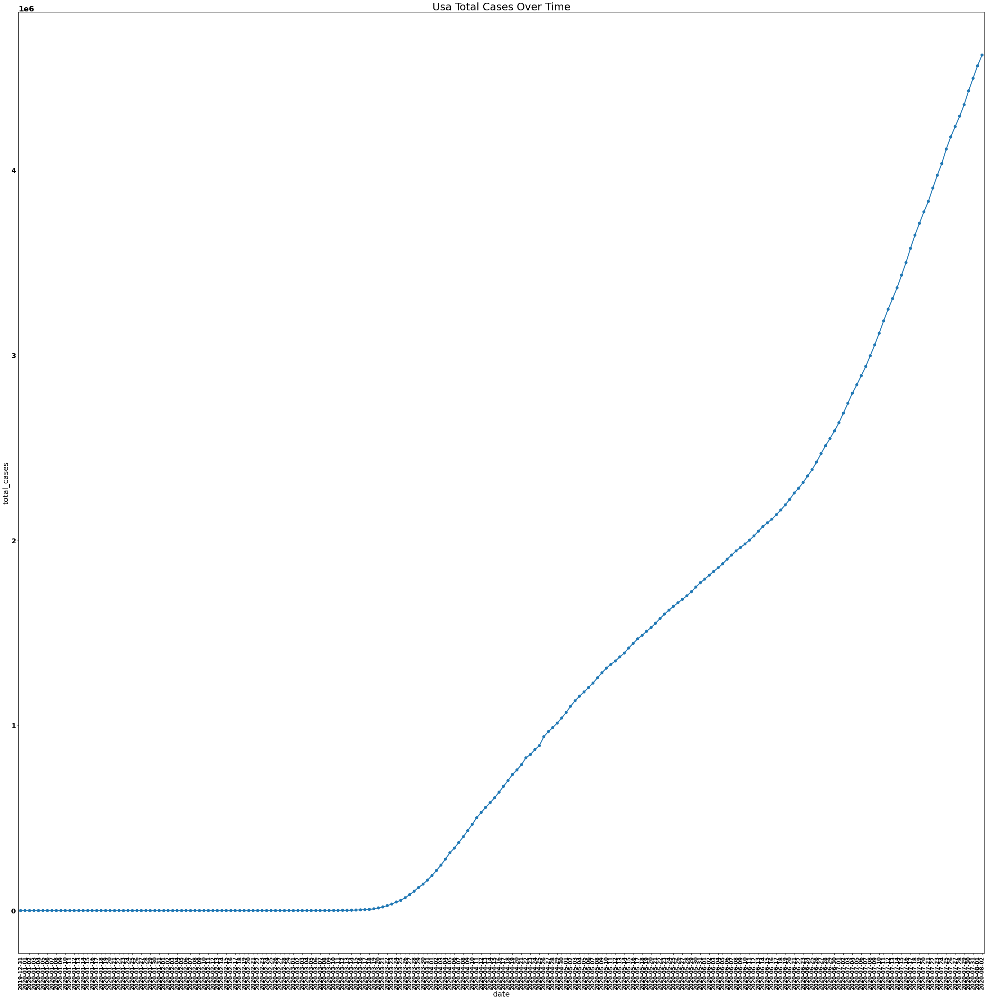

In [ ]:
cases_over_time(loc="United States",title="Usa Total Cases Over Time",type='total_cases')

In [ ]:
cases_per_day(loc="United States",start_date='2020-01-01',finish_date='2020-07-01',title='Confirmed COVID-19 deaths per day in usa',type="new_deaths")

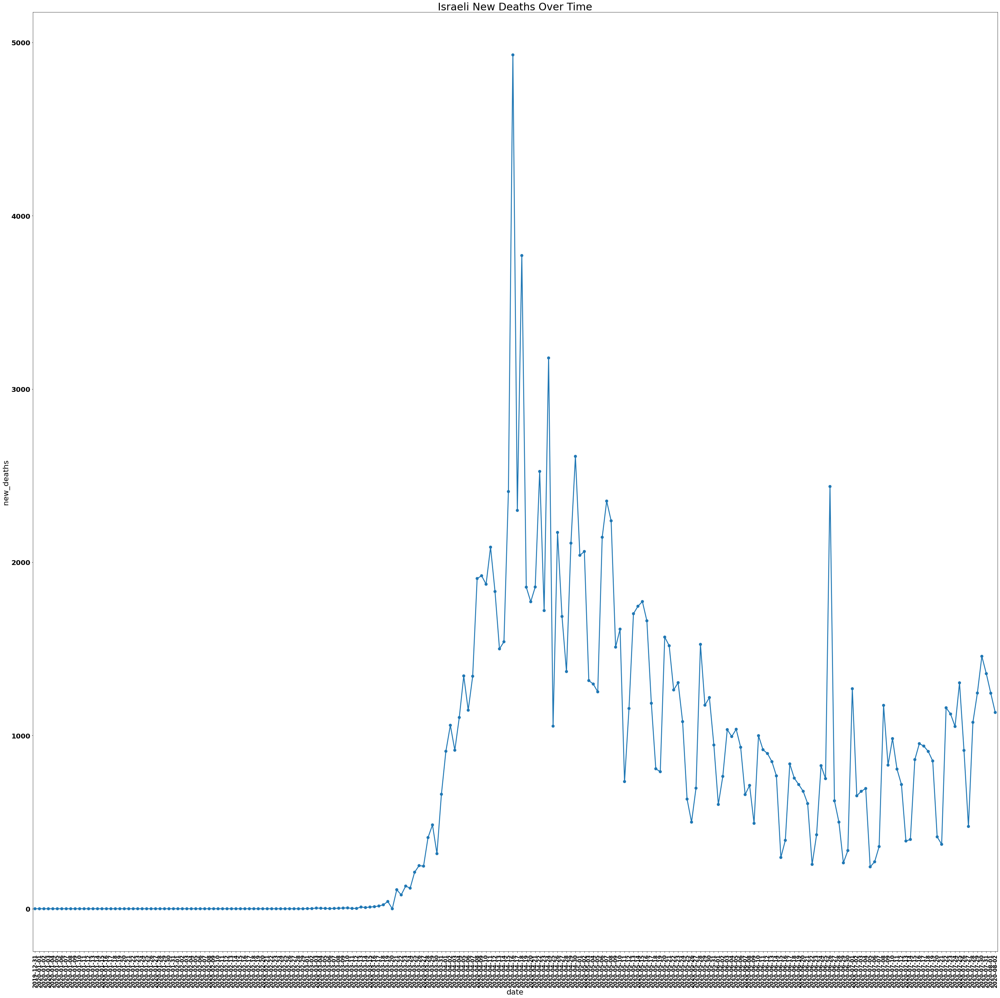

In [ ]:
cases_over_time(loc="United States",title="Israeli New Deaths Over Time",type='new_deaths')

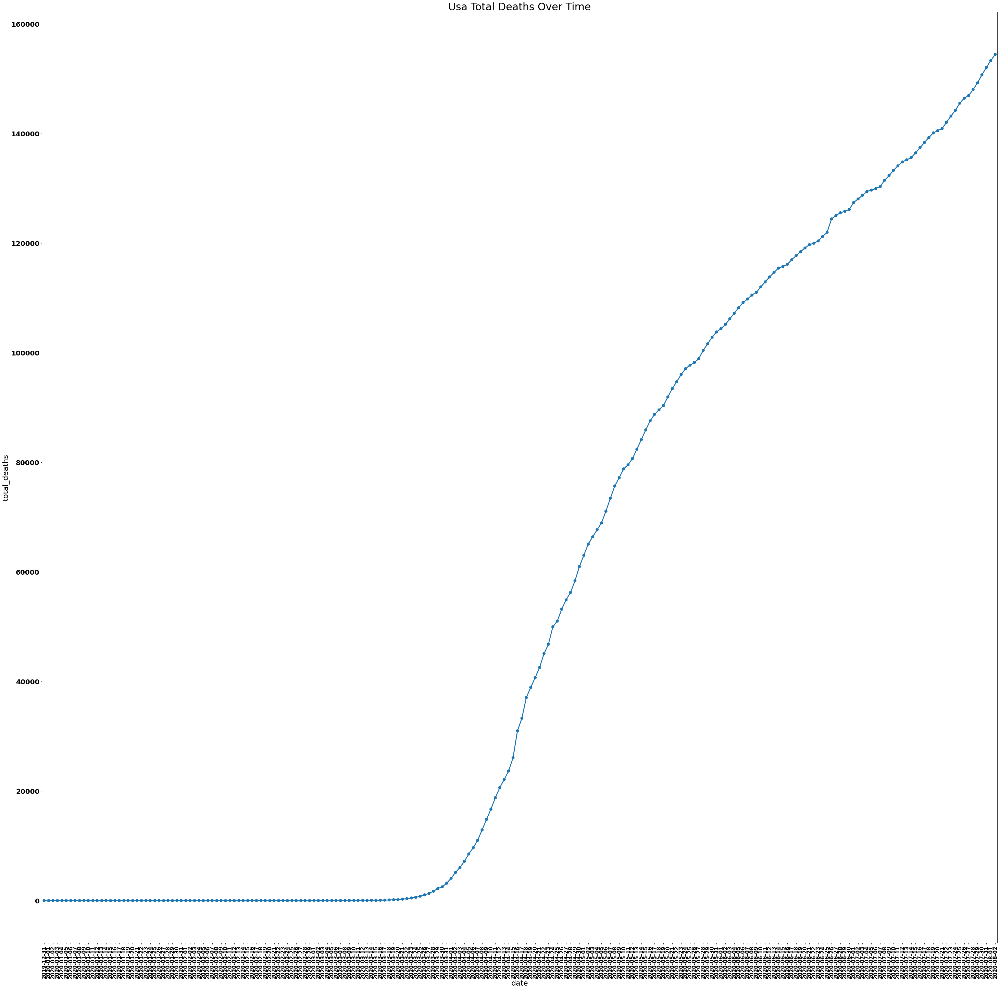

In [ ]:
cases_over_time(loc="United States",title="Usa Total Deaths Over Time",type='total_deaths')

<center><h3>China<h3></center>
<center><h4>Monthly Progression of the disease<h4></center>

[9714.0, 79355.0, 82241.0, 83944.0, 84128.0, 84780.0, 87489.0]

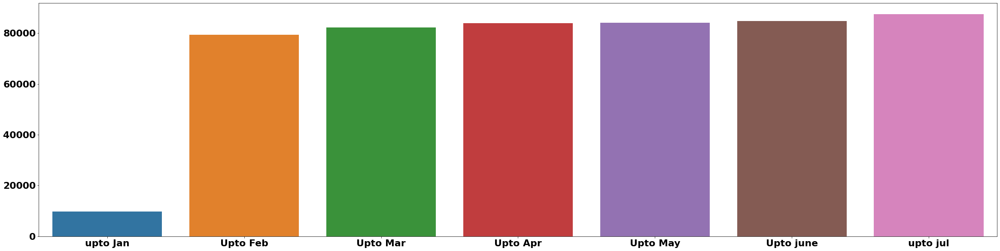

In [ ]:
progrees(data[data.location=="China"])

[9714.0, 69641.0, 2886.0, 1703.0, 184.0, 652.0, 2709.0]

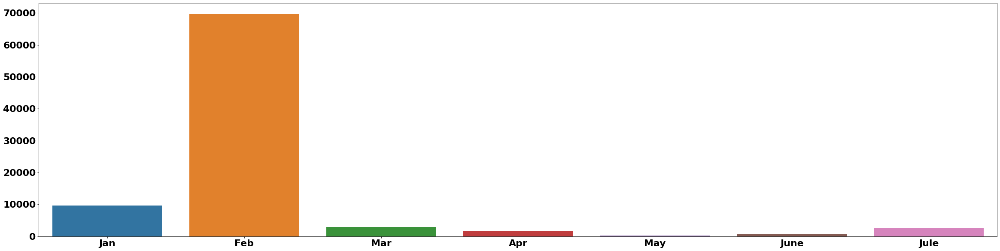

In [ ]:
count_per_month(data[data.location=="China"])

<center><h3>China<h3></center>
<center><h4>Daily stats<h4></center>

In [ ]:
cases_per_day(loc="China",start_date='2020-01-01',finish_date='2020-07-01',title='Confirmed COVID-19 cases per day in China',type="new_cases")

In [ ]:
cases_per_day(loc="China",start_date='2020-01-01',finish_date='2020-07-01',title='Confirmed COVID-19 deaths per day in China',type="new_deaths")

<center><h1>Forecasting<h1><center>
    
    we will try different approachs:
    1. Classical Statistical approach (ARIMA Familiy).
    2. Classical ML approach (linear reggression).
    3. Deep lerning approach (LSTMs,Clstm).
    
 
    
    we will try to predict cases of World and Israel.

## Classical Statistical approach (ARIMA familiy).

In [ ]:
def mape(y_true , y_pred):
     return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
def metrics(y_true,y_pred):
    print("RMSE: {}\n MSE: {}\n MAE: {}\n, MAPE:{}\n".format(mean_squared_error(y_true,y_pred,squared=False),
                                                            mean_squared_error(y_true,y_pred),
                                                            mean_absolute_error(y_true,y_pred),mape(y_true,y_pred)))
def plot_predictions(x_test, y_test, test_pred, estimator_name,title,lower_bound=None,upper_bound=None):
    metrics(test_pred, y_test)
    plt.figure(figsize=(50, 40))
    if lower_bound is not None and upper_bound is not None:
        plt.fill_between(
        lower_bound.index, lower_bound, upper_bound, color="k", alpha=0.20
    )
    plt.plot(x_test, y_test)
    plt.plot(x_test, test_pred, linestyle='dashed', color="purple")
    plt.xlabel('Date', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.legend(['Confirmed Cases', estimator_name], prop={'size': 40})
    plt.xticks(rotation=90,size=15)
    plt.yticks(size=20)
    plt.title(title)
    plt.show()

def preapare_data_arma(loc="Israel",cutoff='2020-02-22',split_steps=14,y="total_cases",forecast=None):
    if forecast is None:
        forecast = pd.read_csv("https://covid.ourworldindata.org/data/owid-covid-data.csv")
        forecast = forecast[forecast.location==loc].ffill()
        forecast = forecast[ ["date"]+[y]]
        forecast=forecast[forecast.date>cutoff].reset_index(drop=True)
    train,test = forecast[:-split_steps],forecast[-split_steps:] 
    train.date = pd.to_datetime(train.date,infer_datetime_format=True)
    train=train.set_index('date')
    test.date = pd.to_datetime(test.date,infer_datetime_format=True)
    test=test.set_index('date')
    return forecast,train,test
def ac_pacf(data,lags=30):
    fig = plt.figure(figsize=(20,10))
    ax1 = fig.add_subplot(211)
    fig = sm.graphics.tsa.plot_acf(data, lags=lags, ax=ax1)  
    ax2 = fig.add_subplot(212)
    fig = sm.graphics.tsa.plot_pacf(data, lags=lags, ax=ax2) 
def rolling_statistics(frame,window=7):
    mean = frame.rolling(window).mean() 
    std = frame.rolling(window).std()
    plt.figure(figsize= (20,10))
    orig = plt.plot(frame,  label='Original')
    mean = plt.plot(mean, label='Rolling Mean')
    std = plt.plot(std,  label='Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
def dickey_fuller(data):
    res = adfuller(data, autolag='AIC')
    dfoutput = pd.Series(res[0:4], index=['Test Statistic','p-value','Lags Used','Number of Observations Used'])
    for key,value in res[4].items():
        dfoutput['Critical Value {}'.format(key)] = value
    print(dfoutput)
def tests(data):
    rolling_statistics(data)
    data.hist()
    dickey_fuller(data)
    ac_pacf(data)
def differ(data,type="total_cases"):
    temp = data.copy()
    temp[type] = (temp[type] - temp[type].shift(1))
    return temp.dropna() 

C:\Users\liorr\miniconda3\envs\tf2\lib\site-packages\pandas\core\generic.py:5303: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Test Statistic                   1.271369
p-value                          0.996444
Lags Used                       14.000000
Number of Observations Used    133.000000
Critical Value 1%               -3.480500
Critical Value 5%               -2.883528
Critical Value 10%              -2.578496
dtype: float64


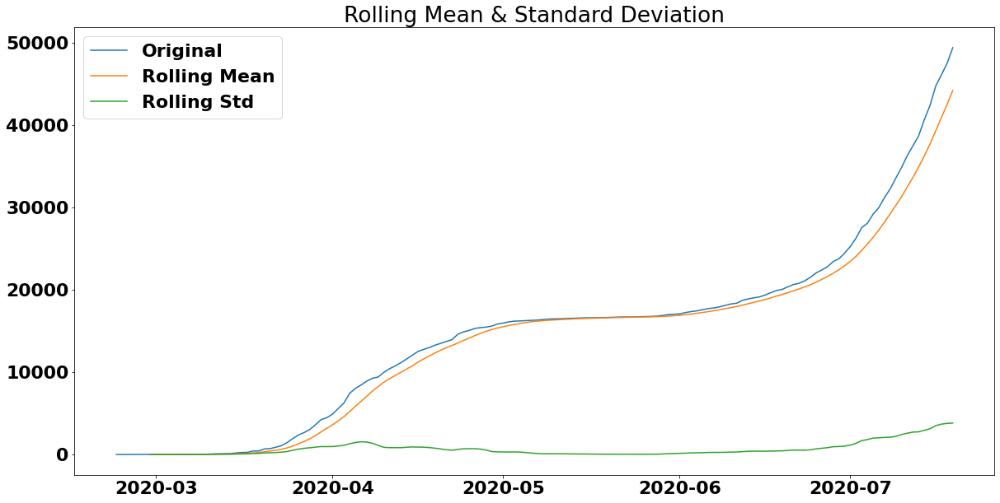

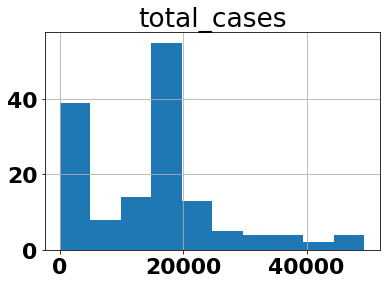

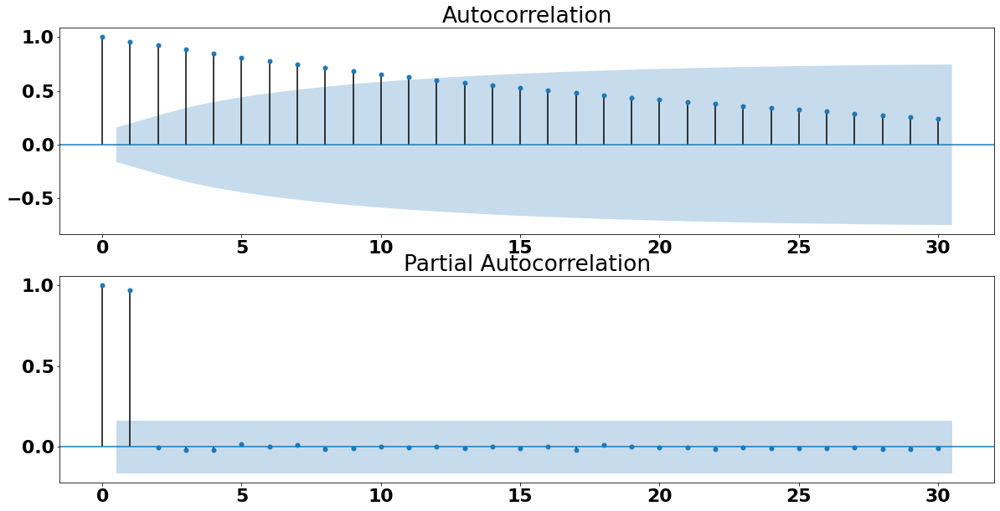

In [ ]:
forecast,train,test = preapare_data_arma()
tests(train)

We can see that rolling that the  mean and std have a trend component, we can see that the they  vary throw time.
to use ARIMA we need to make sure that both of them are constant throw time aka: our time siries must be stationary.

additionaly, Dickey–Fuller test shows that The p-value that obtained is greater than significance level of 0.05 and the ADF statistic is higher than  the critical values.

In conclution!there is no reason to reject the null hypothesis, our data is not sationary.

#### Let's  achieve Stationarity
there are some technices that can help us achive stationarity such as:
differencing, log scale, square root,cube root, exponential decay.

with differencing we may loose information, we may losse the relations between the lags, so 
we will try to achive stationarity with log scale, and if it will not help we will try differencing.

Test Statistic                  -4.044924
p-value                          0.001193
Lags Used                       14.000000
Number of Observations Used    133.000000
Critical Value 1%               -3.480500
Critical Value 5%               -2.883528
Critical Value 10%              -2.578496
dtype: float64


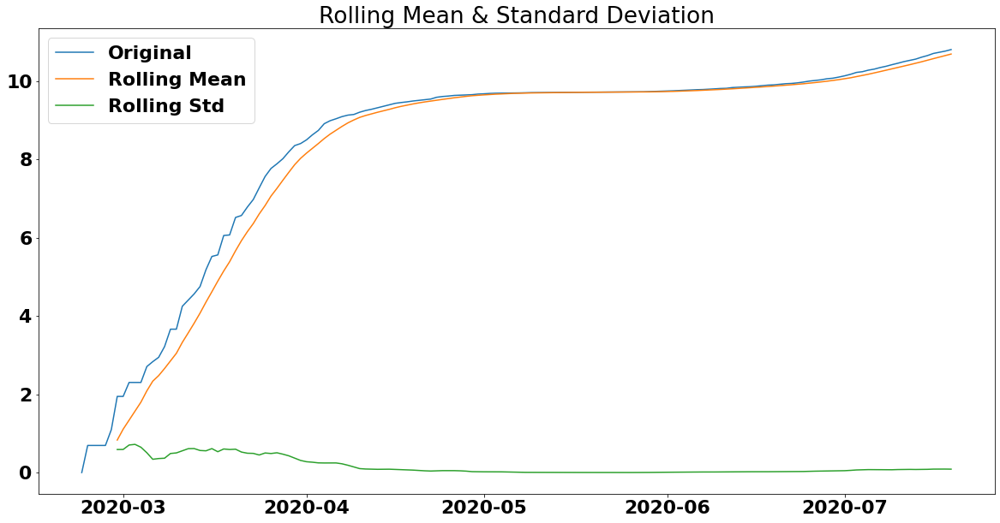

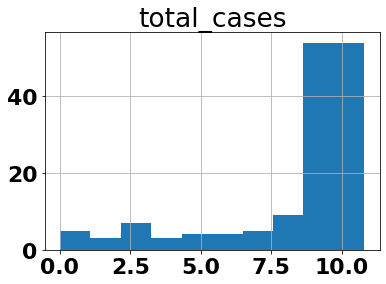

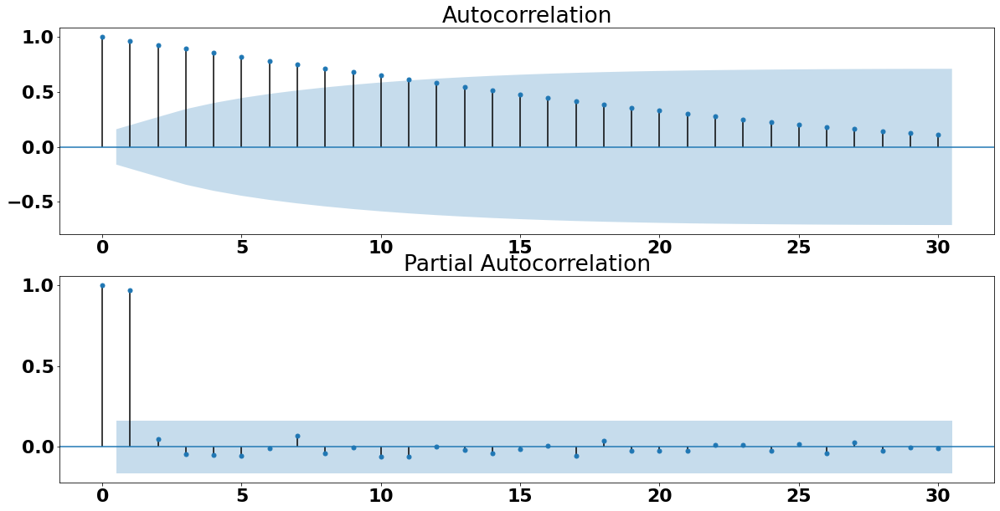

In [ ]:
train=np.log(train)
tests(train)

It worked! the test statistic is lower then all the critical sections and the p-value is lower then 0.05.
Now we need to find the right orders for AR,I and MA.
for I it is 0 becuse our logged seires is stationary.
for AR we can see from the Autocorrelation graph that it is 9-11 (this is the most significant lags) and for the MA it is 2 (we can see this from the partial graph).

In [ ]:
def fit_arima(data,var,type='total_cases',estimator_name="Arima",exp=True,diff=0):
    model = ARIMA(data, var,freq='D')
    model_fit = model.fit(disp=0)
    x_test=data.index
    if exp:
        test_pred = np.exp(model_fit.fittedvalues)
        y_test = np.exp(data[type])
    else:
        test_pred = model_fit.fittedvalues
        y_test = data[type]
    if diff!=0:
        y_test = y_test[diff:]       
        x_test = x_test[diff:] 
    plot_predictions(test_pred=test_pred,
                     y_test=y_test,x_test=x_test,estimator_name=estimator_name,title="train")
    return model,model_fit
def normality_test(model_fit,exp=True):
    residuals = model_fit.resid
    if exp:
        residuals = np.exp(residuals)
    print(normaltest(residuals))
    residuals = pd.DataFrame(residuals)
    residuals.plot(kind='kde')

    fig = plt.figure(figsize=(22,10))
    ax0 = fig.add_subplot(111)

    sns.distplot(residuals ,fit = norm, ax = ax0) 
    (mu, sigma) =norm.fit(residuals)

    plt.legend(['Normal dist. mu {:.4f} and sigma {:.4f} '.format(mu, sigma)], loc='best')
    plt.ylabel('Frequency')
    plt.title('Residual distribution')
    print(residuals.describe())
def test_arima(test,type="total_cases",estimator_name="ARIMA",exp=True):
    forecast, stderr, conf = model_fit.forecast(steps=len(test))
    test["forecasted"] = np.exp(forecast) if exp else forecast
    if exp:
        conf = np.exp(conf) 
    test["upper_bound"] = conf[:,1]
    test["lower_bound"] = conf[:,0]
    print(test)
    plot_predictions(x_test=test.index, y_test=test[type], test_pred=test["forecasted"], 
                     estimator_name=estimator_name,title="test",lower_bound=test["lower_bound"],
                     upper_bound=test["upper_bound"])

C:\Users\liorr\miniconda3\envs\tf2\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



RMSE: 415.11720617857605
 MSE: 172322.29486550644
 MAE: 294.8111575484571
, MAPE:6.512612844722014



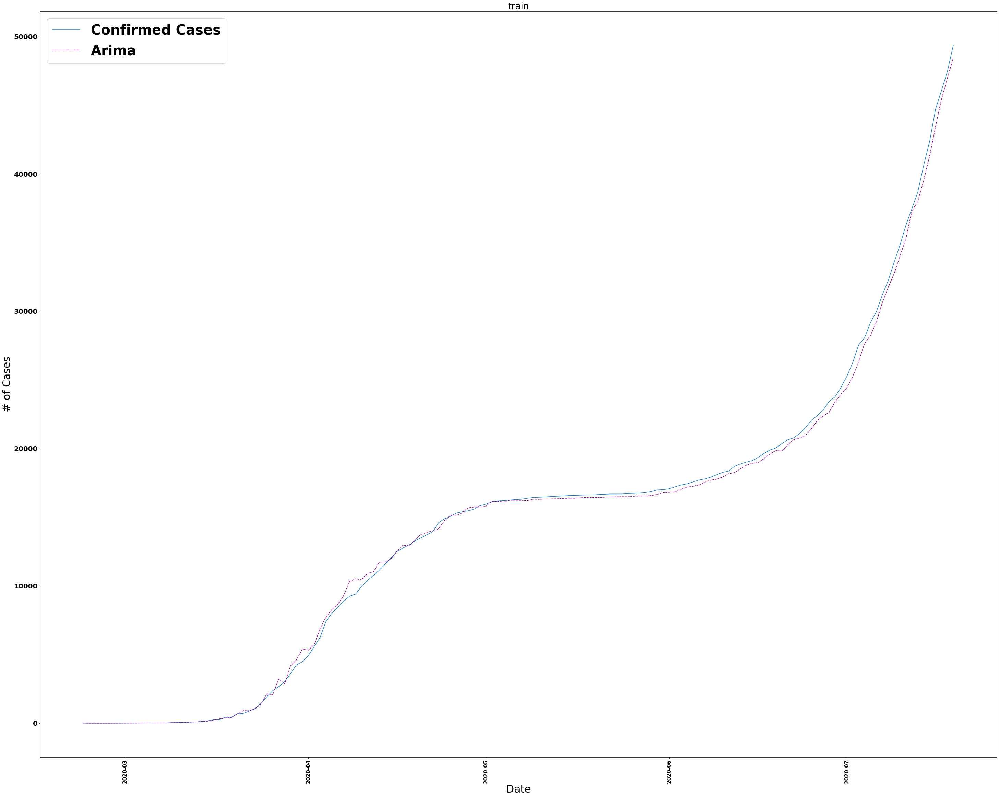

NormaltestResult(statistic=63.83799251644543, pvalue=1.3732703935364605e-14)
                0
count  148.000000
mean     1.004530
std      0.146636
min      0.054601
25%      0.989860
50%      1.012072
75%      1.020061
max      1.998662
            total_cases    forecasted    upper_bound   lower_bound
date                                                              
2020-07-20      50289.0  50783.009369   60558.511200  42585.492765
2020-07-21      51676.0  52575.160187   66427.352035  41611.585951
2020-07-22      54042.0  53608.631680   71529.497712  40177.625770
2020-07-23      56085.0  54959.624673   75694.932661  39904.393042
2020-07-24      57982.0  56005.127043   79284.913604  39560.795522
2020-07-25      59475.0  57736.510134   86244.844913  38651.638899
2020-07-26      60678.0  58983.291291   94706.303855  36734.921646
2020-07-27      61956.0  59706.498058  103615.995577  34404.590628
2020-07-28      64458.0  60630.181505  109745.827178  33495.751081
2020-07-29      66555.0 

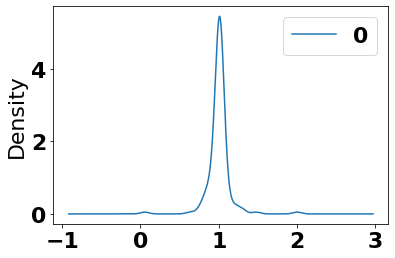

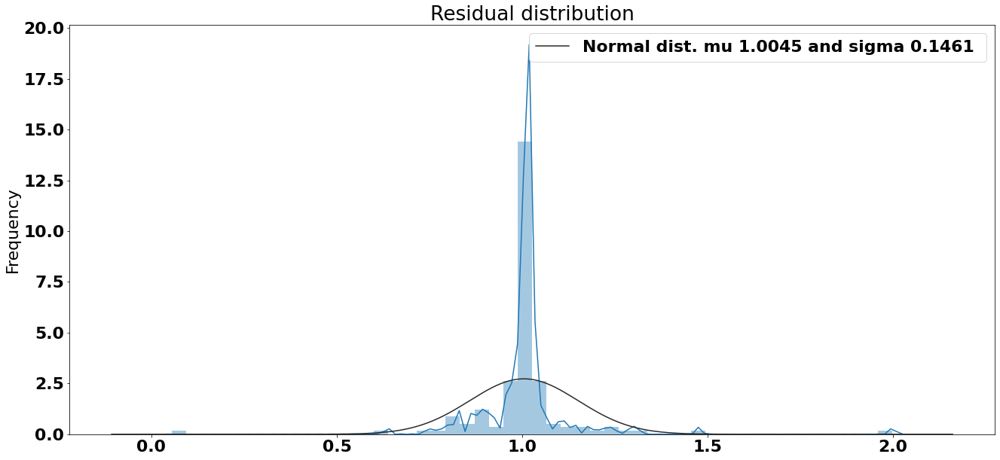

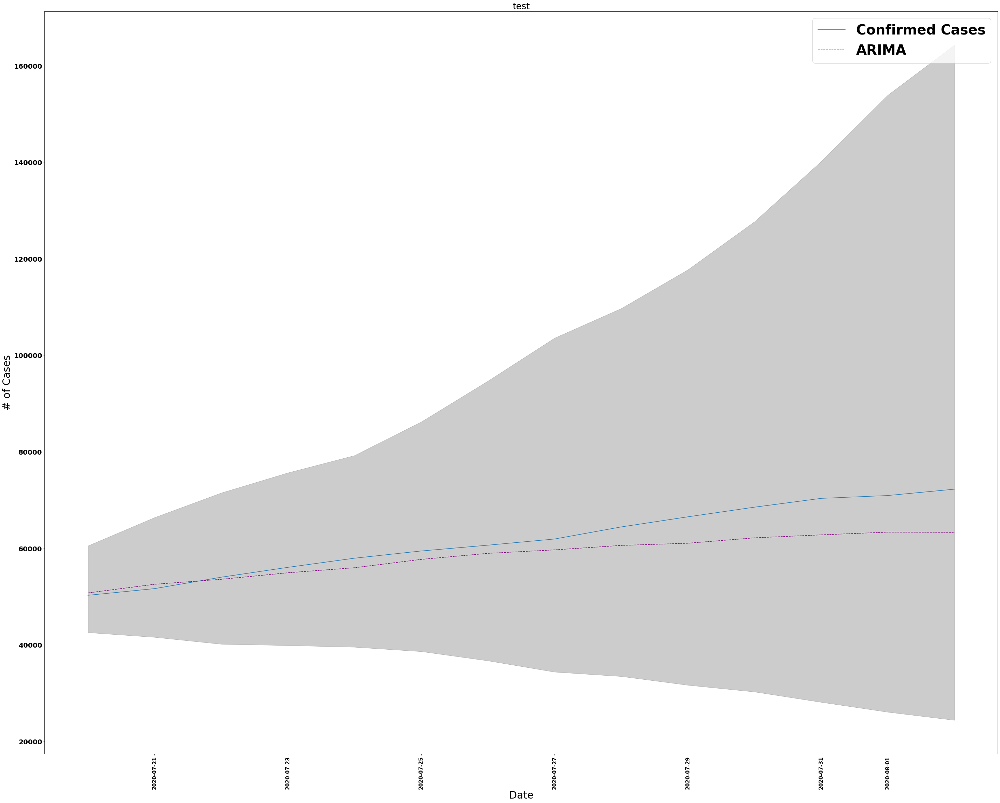

In [ ]:
model,model_fit = fit_arima(train,(11,0,0))
normality_test(model_fit)
test_arima(test)

from the normallity test we can see that we have bias. 
from the test set we can see that we are in the confident zone, that the trend is right, but, we have big error rate.
Let's try the same for World

Test Statistic                   3.191211
p-value                          1.000000
Lags Used                       12.000000
Number of Observations Used    135.000000
Critical Value 1%               -3.479743
Critical Value 5%               -2.883198
Critical Value 10%              -2.578320
dtype: float64


C:\Users\liorr\miniconda3\envs\tf2\lib\site-packages\pandas\core\generic.py:5303: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



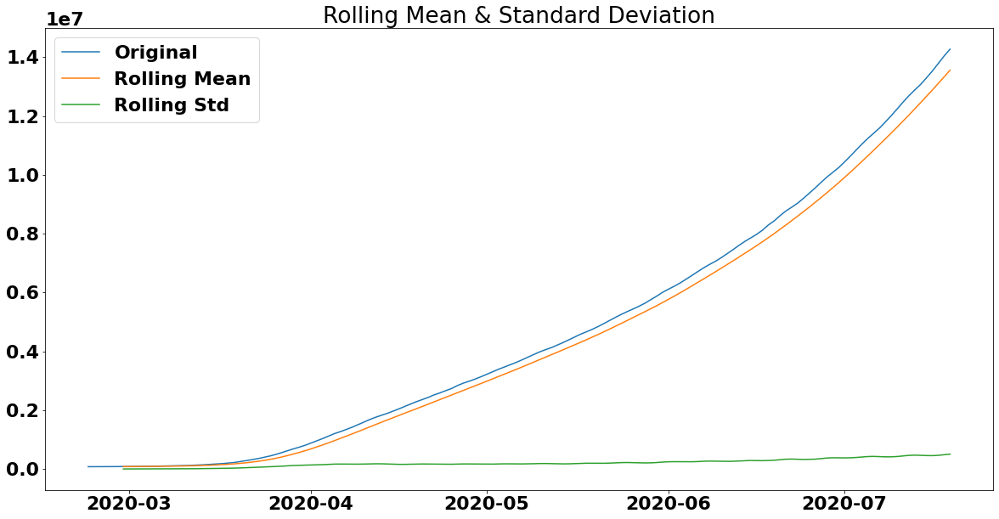

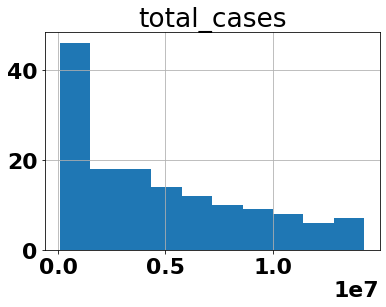

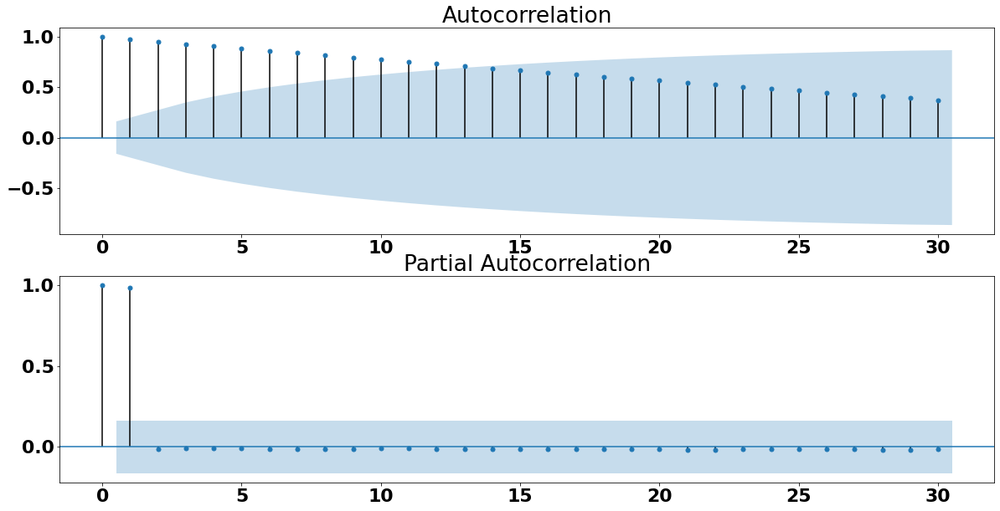

In [ ]:
forecast,train,test = preapare_data_arma(loc="World")
tests(train)

Test Statistic                  -4.521132
p-value                          0.000180
Lags Used                       10.000000
Number of Observations Used    137.000000
Critical Value 1%               -3.479007
Critical Value 5%               -2.882878
Critical Value 10%              -2.578149
dtype: float64


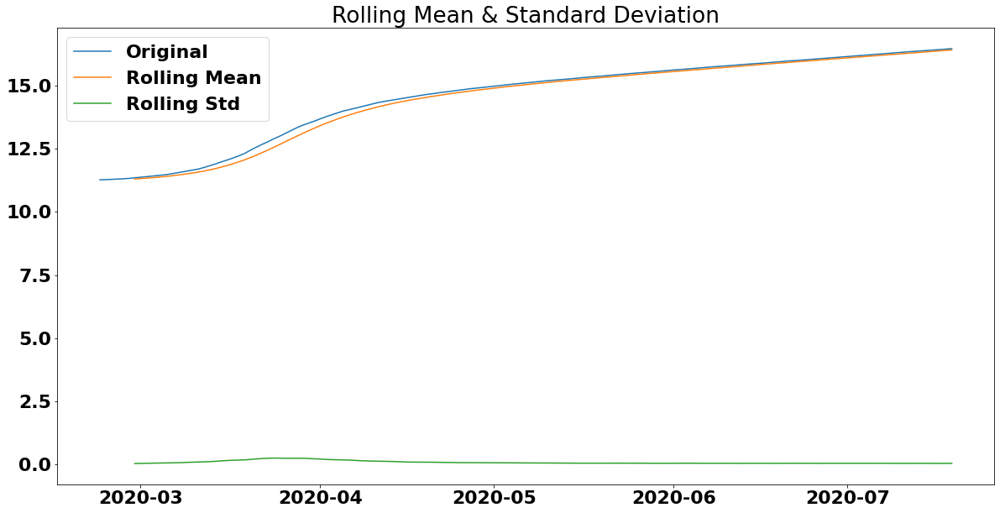

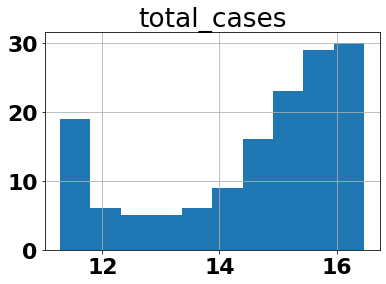

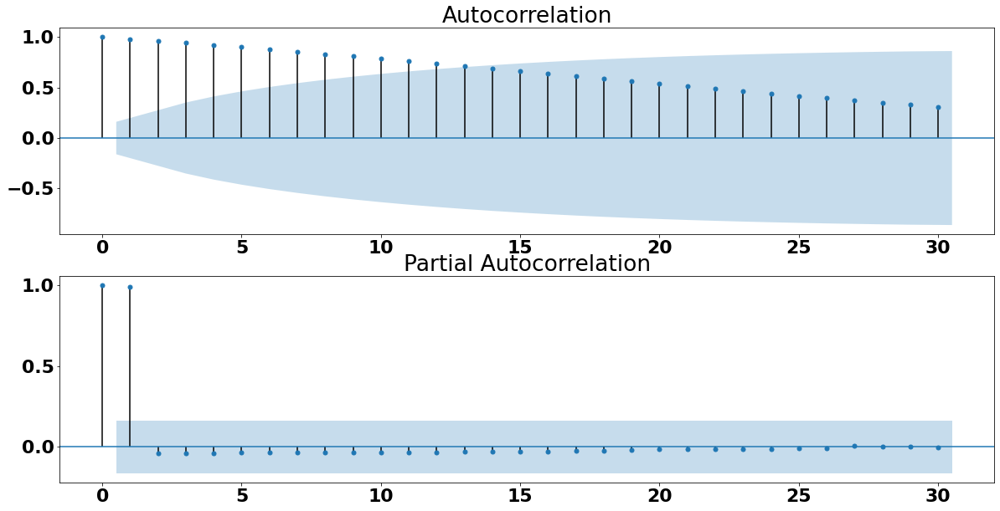

In [ ]:
train=np.log(train)
tests(train)

C:\Users\liorr\miniconda3\envs\tf2\lib\site-packages\statsmodels\base\model.py:548: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

C:\Users\liorr\miniconda3\envs\tf2\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



RMSE: 993816.8247465946
 MSE: 987671881149.4036
 MAE: 88765.32074639016
, MAPE:0.9482140131144811



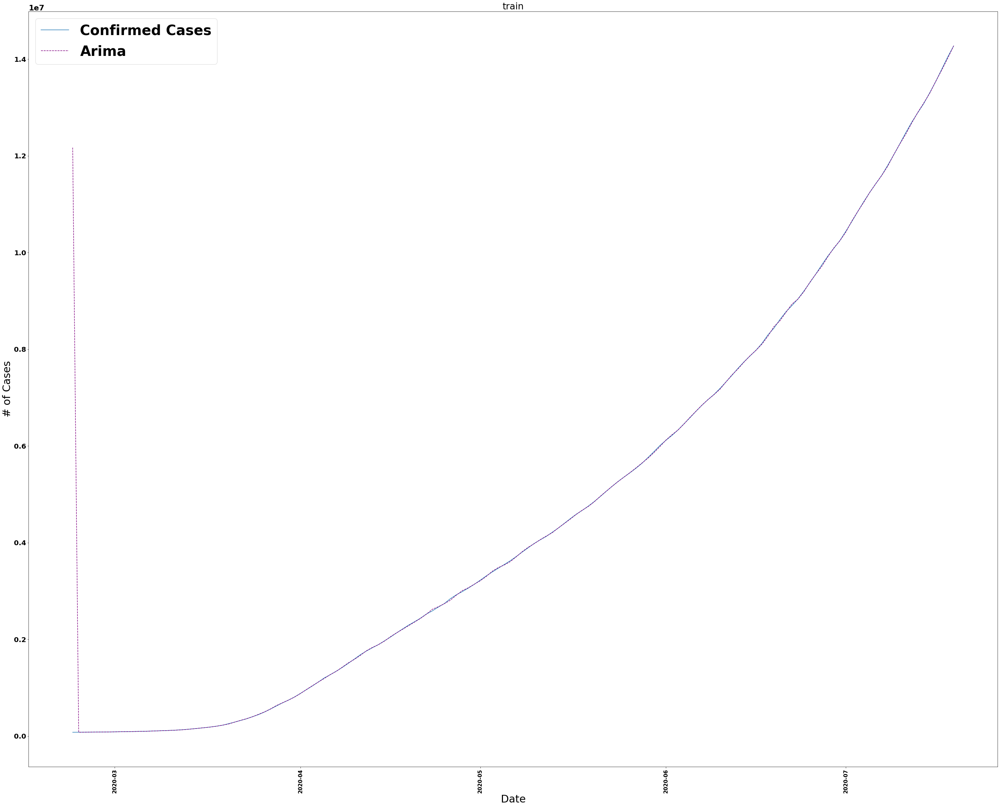

NormaltestResult(statistic=321.5305509132358, pvalue=1.515402458662962e-70)
                0
count  148.000000
mean     0.993708
std      0.081829
min      0.006477
25%      0.998733
50%      1.000202
75%      1.002028
max      1.027227
            total_cases    forecasted   upper_bound   lower_bound
date                                                             
2020-07-20   14482955.0  1.448729e+07  1.462686e+07  1.434904e+07
2020-07-21   14684354.0  1.469393e+07  1.494339e+07  1.444864e+07
2020-07-22   14924031.0  1.491911e+07  1.531617e+07  1.453234e+07
2020-07-23   15205704.0  1.516676e+07  1.572823e+07  1.462533e+07
2020-07-24   15482032.0  1.542056e+07  1.619132e+07  1.468650e+07
2020-07-25   15765917.0  1.565780e+07  1.666808e+07  1.470876e+07
2020-07-26   16025399.0  1.586926e+07  1.716485e+07  1.467146e+07
2020-07-27   16257213.0  1.605554e+07  1.770033e+07  1.456360e+07
2020-07-28   16469445.0  1.623405e+07  1.830769e+07  1.439528e+07
2020-07-29   16713047.0  1.642468e+0

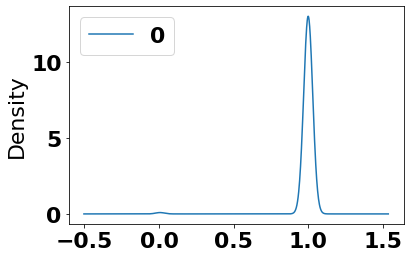

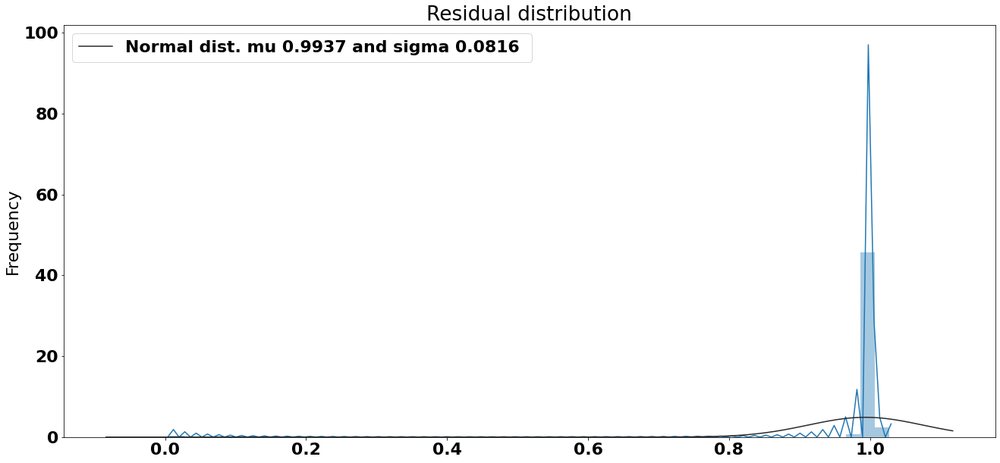

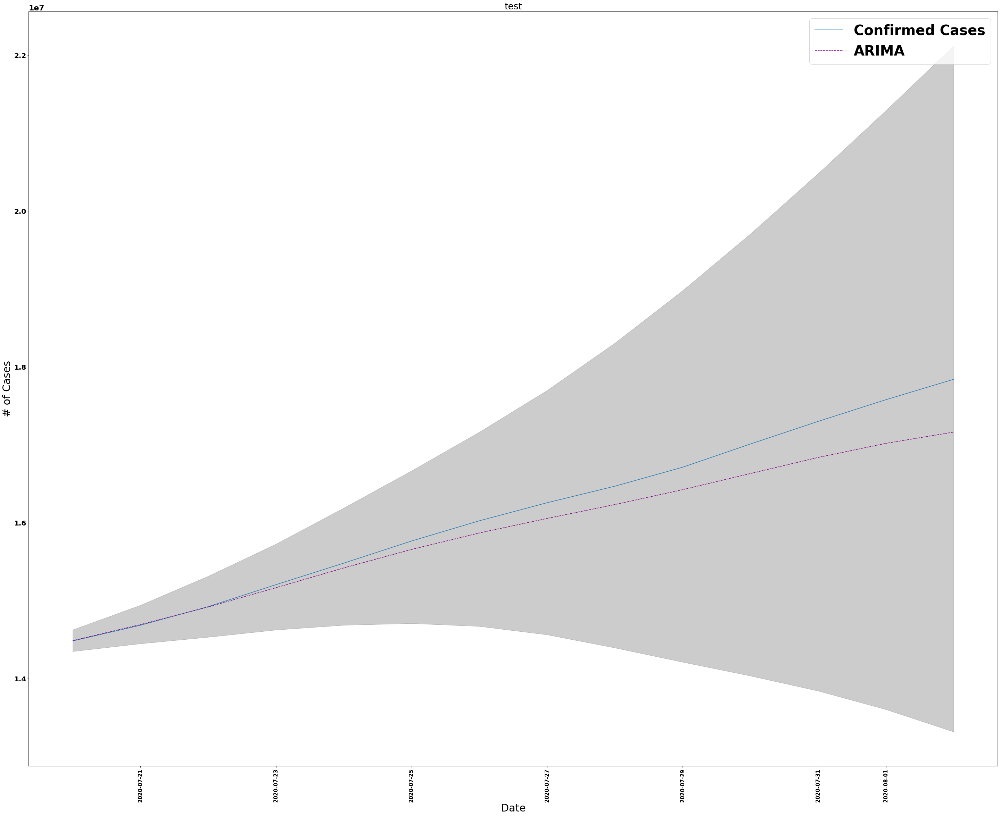

In [ ]:
model,model_fit = fit_arima(train,(14,0,0))
normality_test(model_fit)
test_arima(test)

## Classical ML approach.
we are trying to predict some continus value, so our hypothesis space
is the regression space.
but the truth is that the regression space is too big space, we need to nerow it down 
(too little space may couse problems of bias. aka. underfiting, too big (with little data may end up with high variance aka. overfiting), so for classical ML we will try to nerow it down into the linear regression space, but! it may couse a problem
linear models have the assumpations of independets.

given this insights we will try the following linear model: polynomial reggresion.

In [ ]:
from sklearn.preprocessing import StandardScaler
#scaler = StandardScaler()
#from sklearn import preprocessing
def preapare_data(loc="World",cutoff='2020-02-22',split_percent=0.9,y=["total_cases"],x=[],forecast=None):
    if forecast is None:
        forecast = pd.read_csv("https://covid.ourworldindata.org/data/owid-covid-data.csv")
        org_forecast = forecast.copy()
    else:
        org_forecast = forecast
    forecast = forecast[forecast.location==loc].ffill()
    forecast = forecast[ ["date"]+x+y]
    forecast=forecast[forecast.date>cutoff].reset_index(drop=True)
    forecast["delta_days"] = forecast.index
    split = int(split_percent*len(forecast))
    train,test = forecast[:split],forecast[split:] 
    train_y,test_y = train[y],test[y]
 #   train_y =  scaler.fit_transform(train_y)  
    return forecast,train[["delta_days"]+x],test[["delta_days"]+x],train_y,test_y 

In [ ]:
def poly_features(x_train,x_test,degree=1):
    poly = PolynomialFeatures(degree=degree)
    return poly.fit_transform(x_train),poly.transform(x_test)
def linear_model(x_train, y_train):
    linear_model = LinearRegression(normalize=True, fit_intercept=True)
    linear_model.fit(x_train, y_train)
    return linear_model

In [ ]:
def fit_and_test_poly(estimator_name='single Polynomial Regression degree 1',degree=1,loc="World",cutoff='2020-02-22',split_percent=0.90,y=["total_cases"],x=[],forecast=None):
    forecast,x_train,x_test,y_train,y_test = preapare_data(loc=loc,cutoff=cutoff,split_percent=split_percent,y=y,x=x,forecast=forecast)
    x_train,x_test,y_train,y_test = x_train.to_numpy(),x_test.to_numpy(),y_train.to_numpy(),y_test.to_numpy()
    poly_train,poly_test=poly_features(x_train=x_train,x_test=x_test,degree=degree)
    model = linear_model(x_train=poly_train,y_train=y_train)
    y_fited = model.predict(poly_train)#scaler.inverse_transform(linear_model.predict(x_test))
    x_train = forecast.date[(x_train.min()<=forecast.delta_days)&(forecast.delta_days<=x_train.max())]
    plot_predictions(test_pred=y_fited,y_test=y_train,x_test=x_train,estimator_name=estimator_name,title="train")
    y_pred  = model.predict(poly_test)
    x_test =  forecast.date[(x_test.min()<=forecast.delta_days)&(forecast.delta_days<=x_test.max())]
    plot_predictions(test_pred=y_pred,y_test=y_test,x_test=x_test,estimator_name=estimator_name,title="test")
    return model,forecast

RMSE: 970865.7491594699
 MSE: 942580302890.9786
 MAE: 813747.0583590964
, MAPE:41.20917269780426



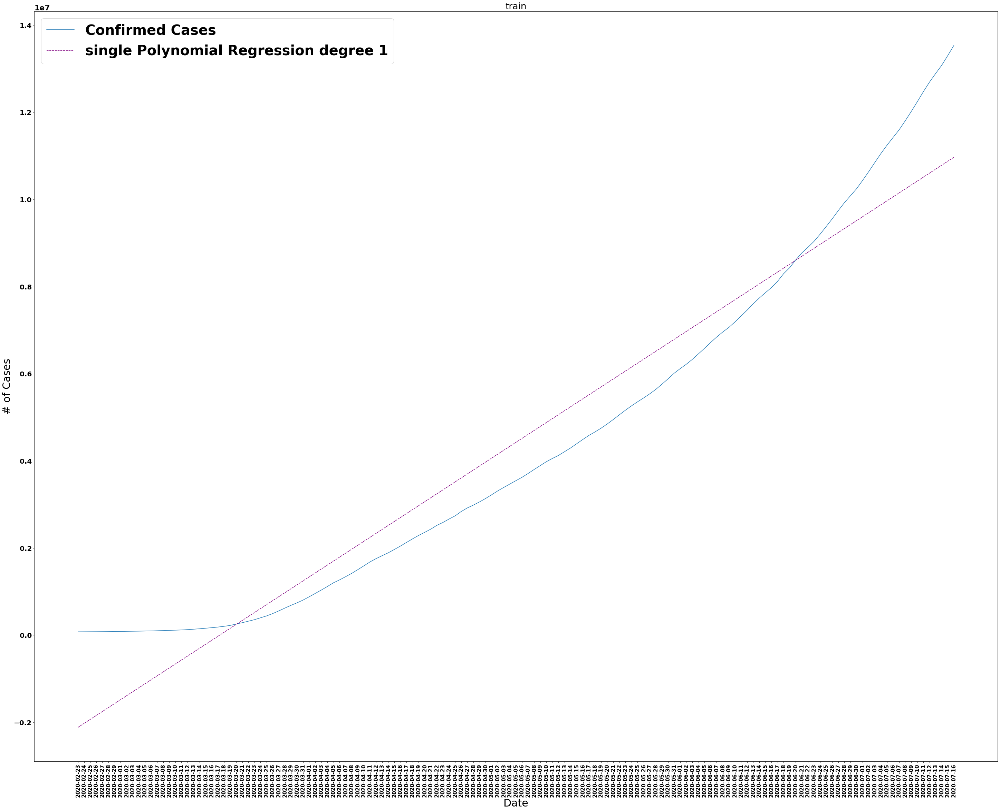

RMSE: 4049870.085984585
 MSE: 16401447713352.787
 MAE: 3970580.925822471
, MAPE:33.48357738620698



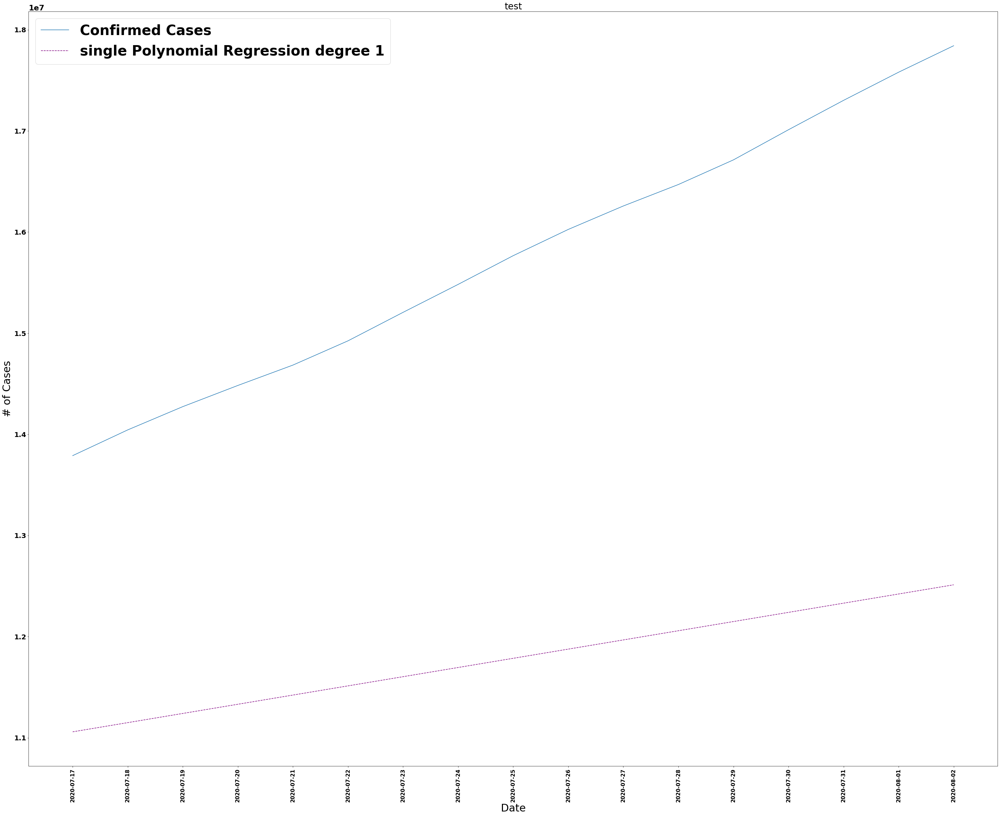

In [ ]:
world_poly1,dataset = fit_and_test_poly(degree=1,forecast=data)

RMSE: 175487.2208945721
 MSE: 30795764697.300335
 MAE: 151827.17767642473
, MAPE:256.0688573226105



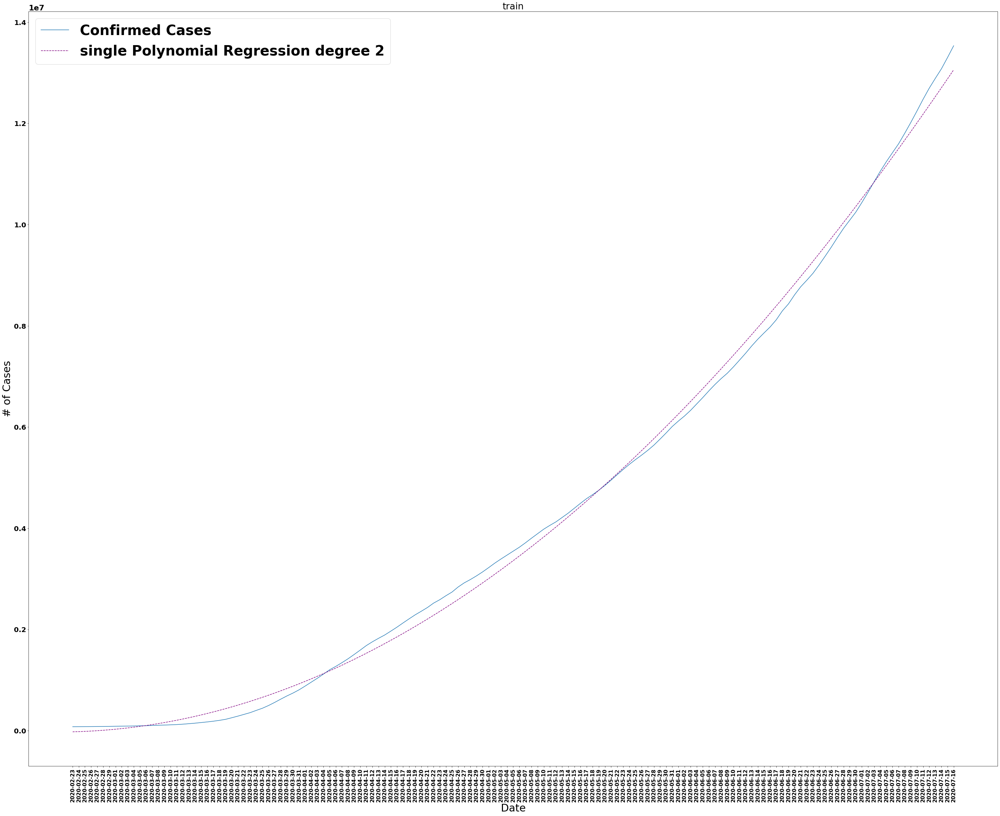

RMSE: 1072548.1611867857
 MSE: 1150359558065.155
 MAE: 1025380.8751175642
, MAPE:6.8545335724928265



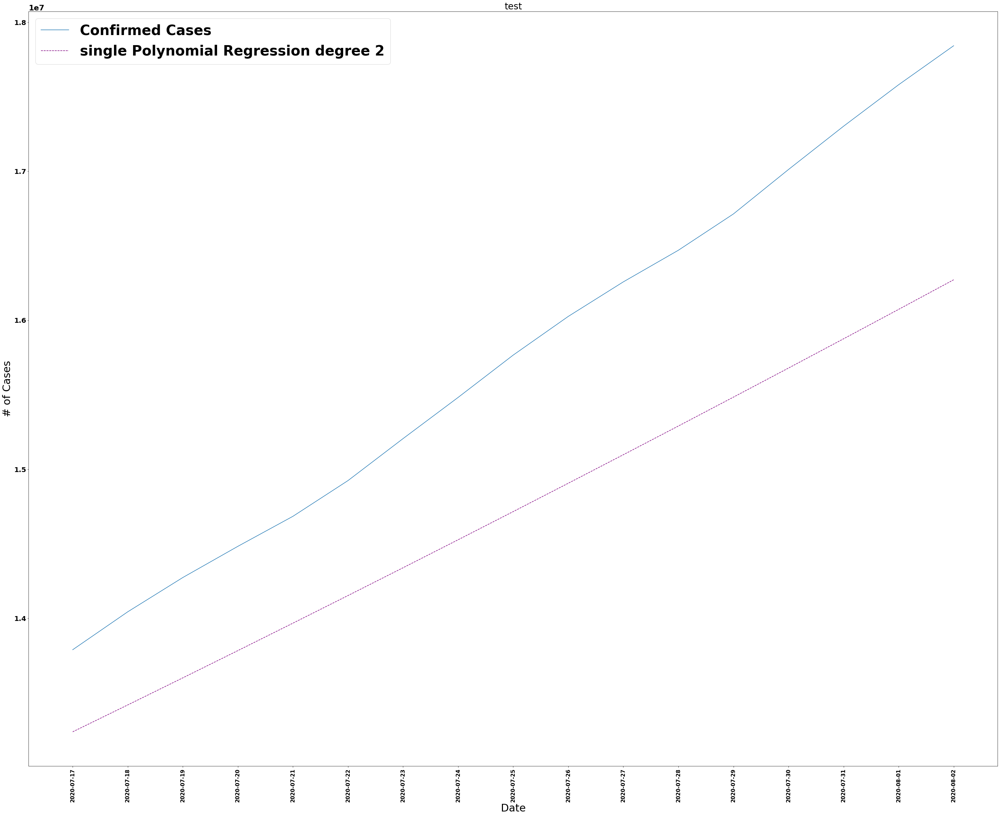

In [ ]:
world_poly2,dataset = fit_and_test_poly('single Polynomial Regression degree 2',degree=2,forecast=data)

RMSE: 160090.4026620581
 MSE: 25628937024.499897
 MAE: 140534.17948616075
, MAPE:33.302063911487956



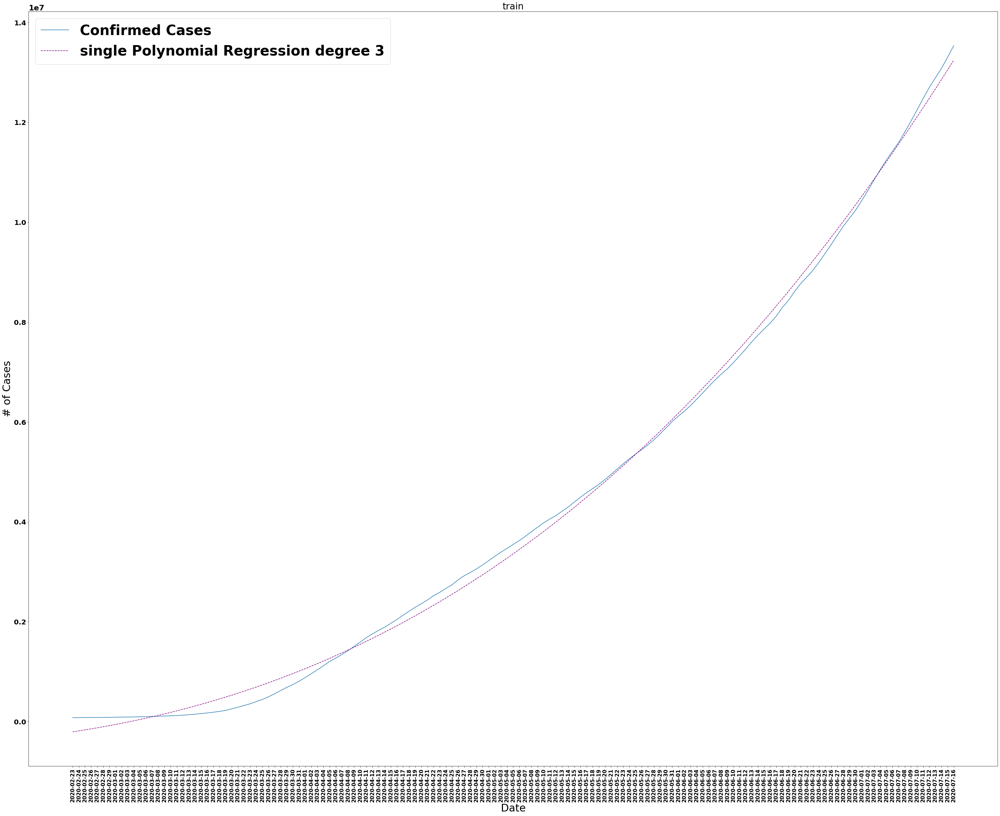

RMSE: 706696.5172568049
 MSE: 499419967502.8975
 MAE: 673621.2779576923
, MAPE:4.391236400843762



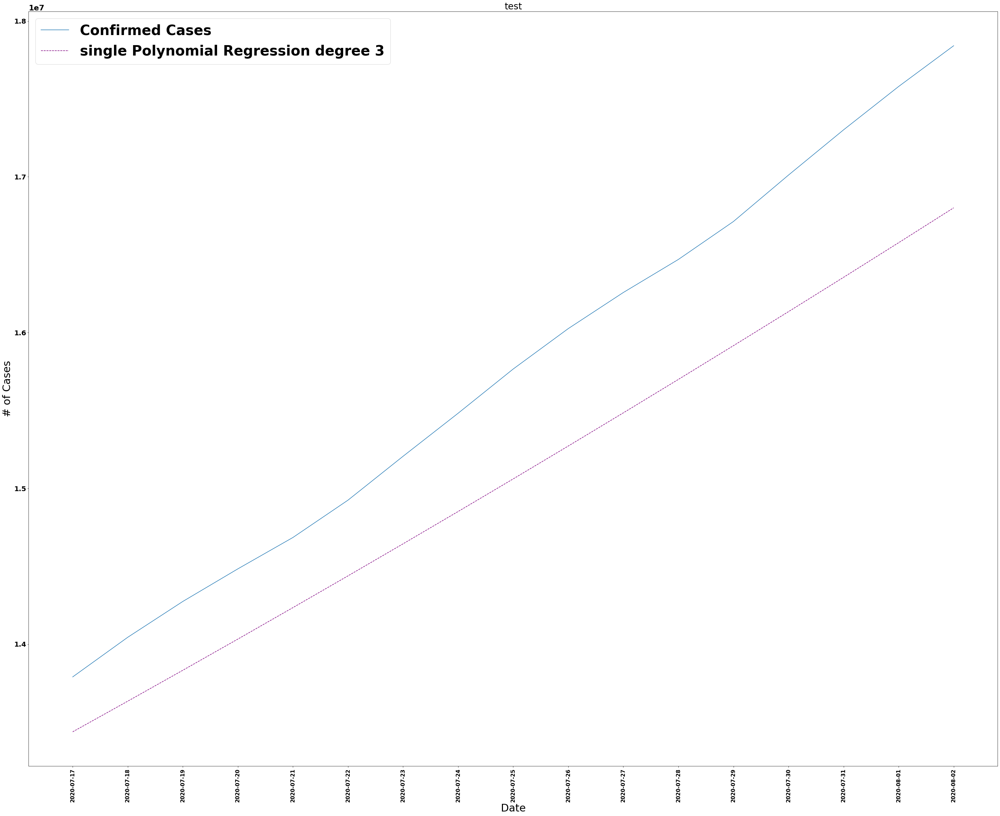

In [ ]:
world_poly3,dataset = fit_and_test_poly('single Polynomial Regression degree 3',degree=3,forecast=data) 

RMSE: 57213.37865331383
 MSE: 3273370696.9274664
 MAE: 47431.13542406423
, MAPE:76.4907072013718



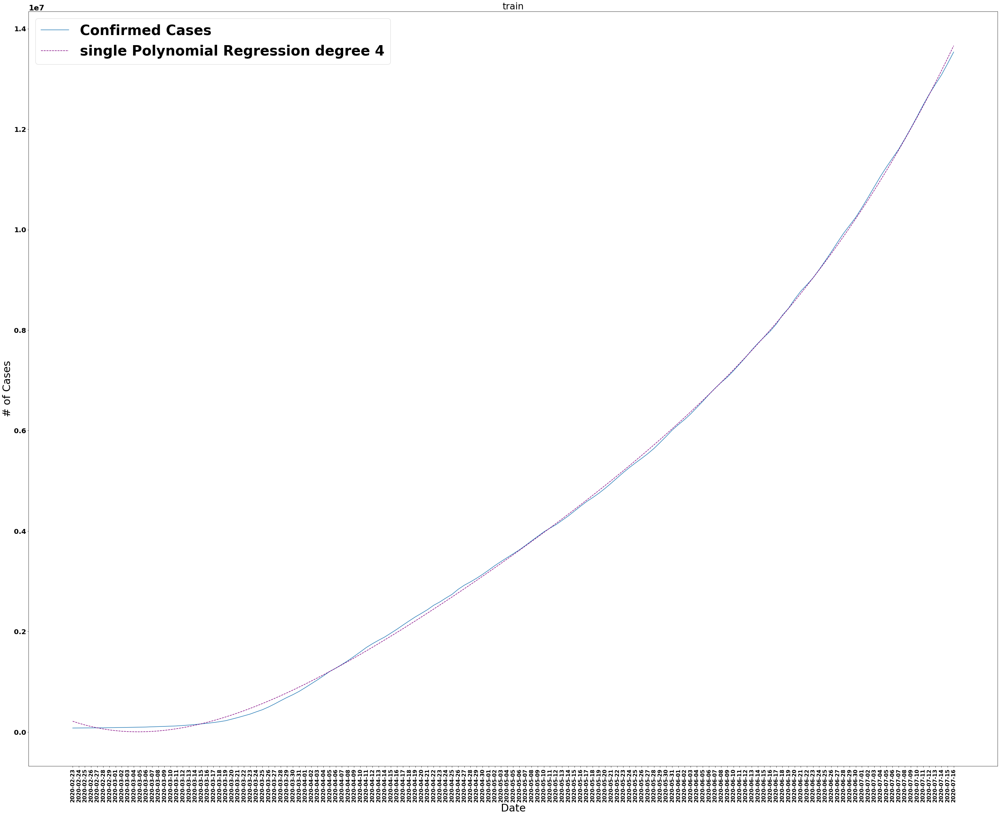

RMSE: 586618.2763799173
 MSE: 344121002182.94507
 MAE: 513271.0095123767
, MAPE:3.021460439395747



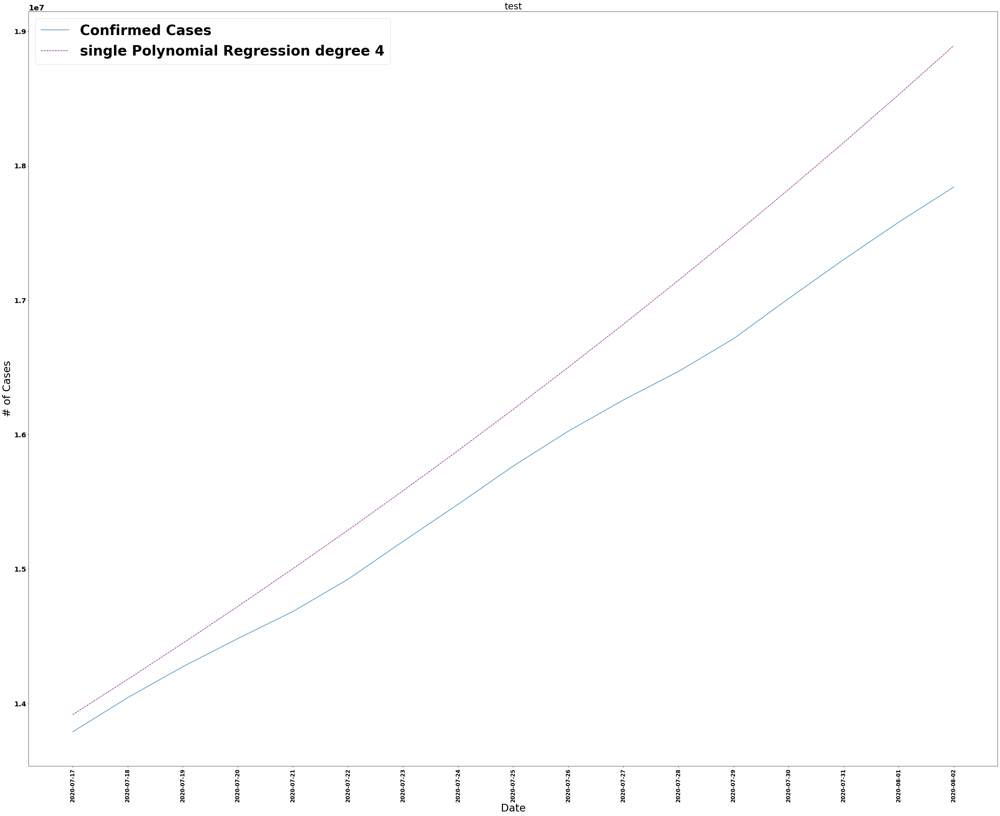

In [ ]:
world_poly4,dataset = fit_and_test_poly('single Polynomial Regression degree 4',degree=4,forecast=data) 

RMSE: 54401.43206985011
 MSE: 2959515811.250516
 MAE: 41910.34678657239
, MAPE:94.37146609089743



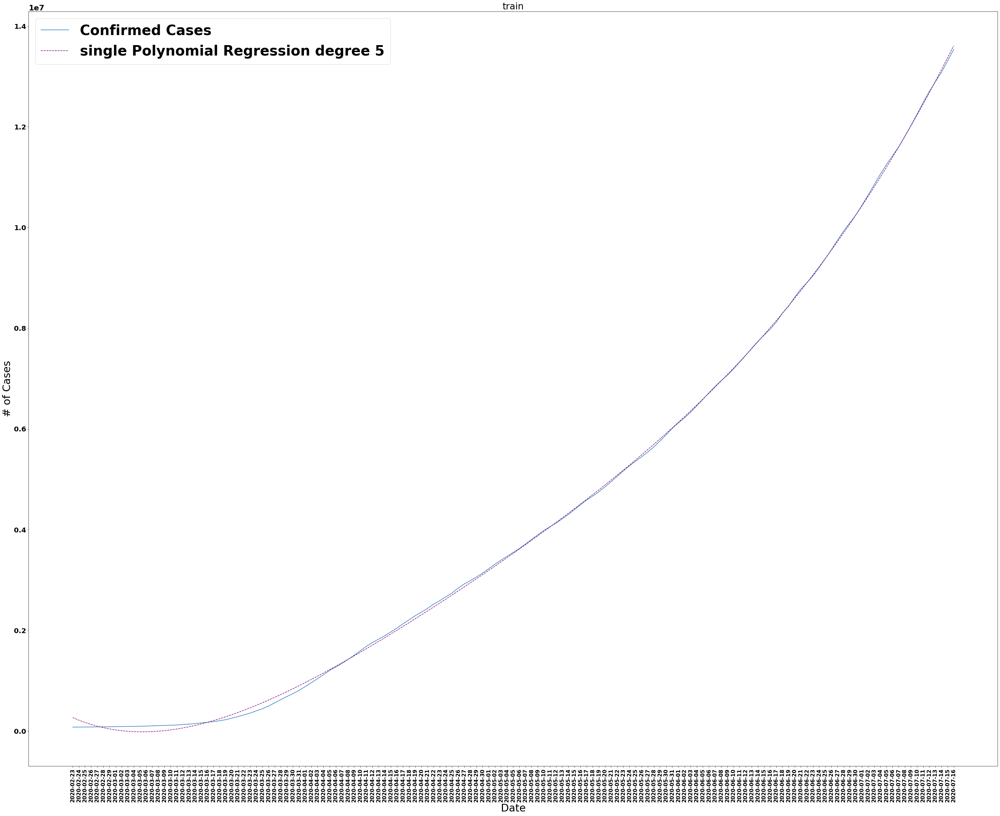

RMSE: 321933.94114829146
 MSE: 103641462463.27158
 MAE: 279555.73758031824
, MAPE:1.6719030106000936



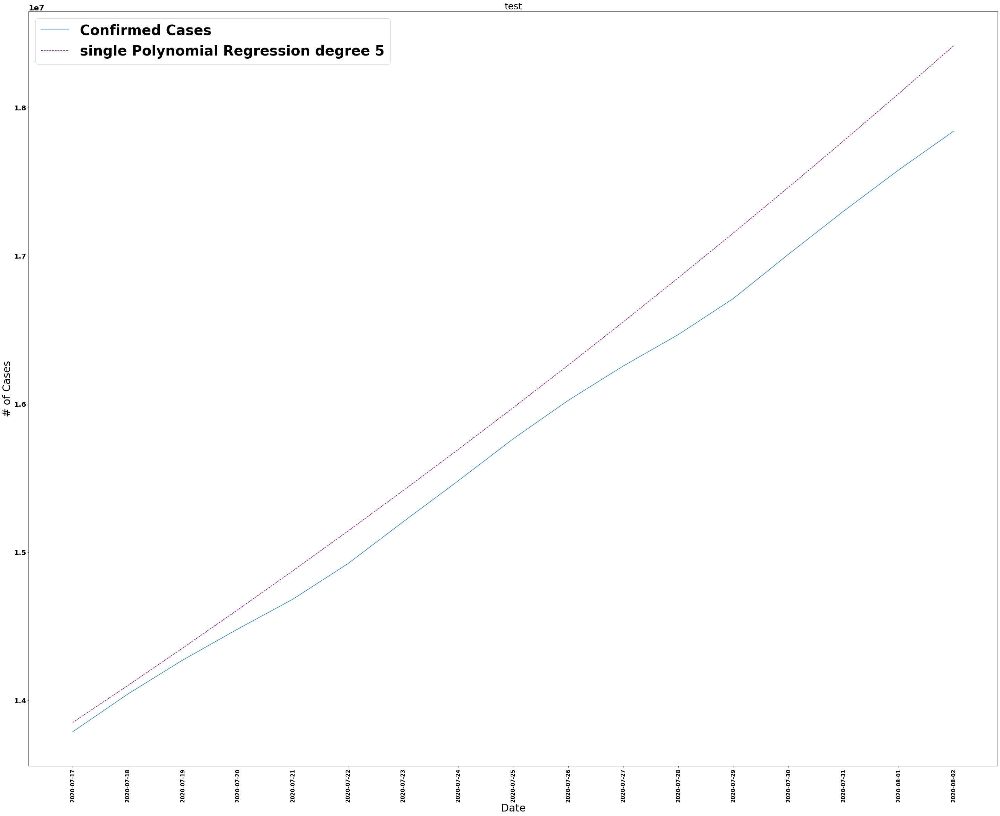

In [ ]:
world_poly5,dataset = fit_and_test_poly('single Polynomial Regression degree 5',degree=5,forecast=data) 

we can see that..

## Israel ##

RMSE: 3311.3632835944477
 MSE: 10965126.795937404
 MAE: 2628.855572133631
, MAPE:33.90536011120214



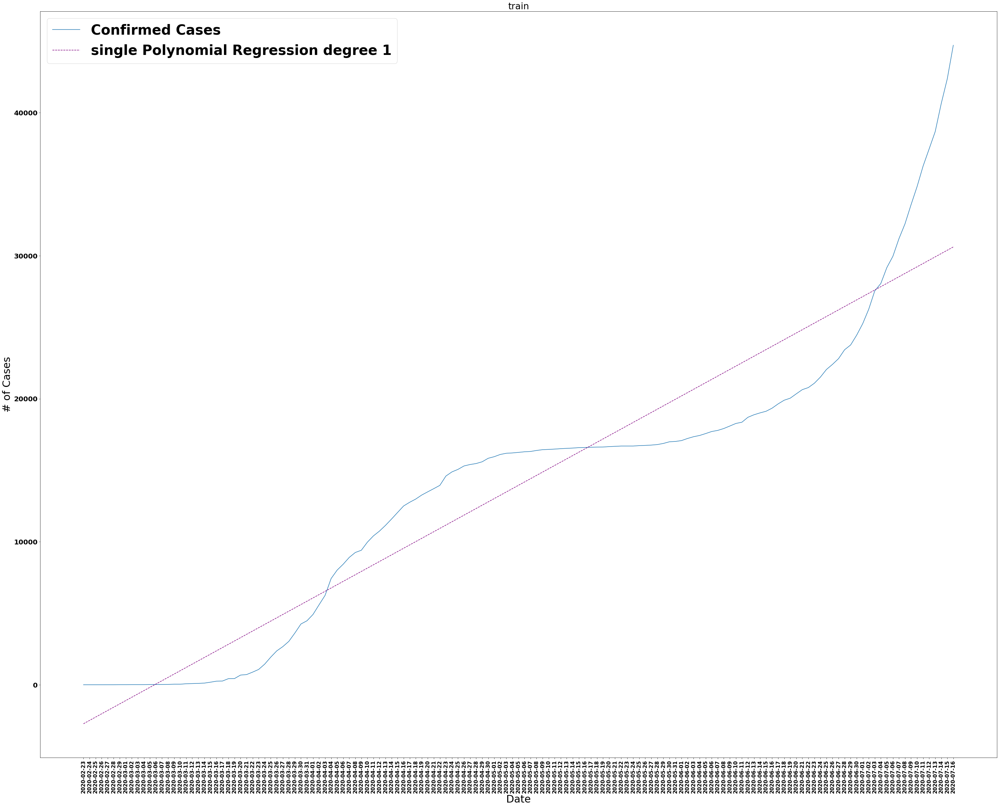

RMSE: 27585.379402990173
 MSE: 760953156.8069144
 MAE: 26615.32354122093
, MAPE:80.73512009513618



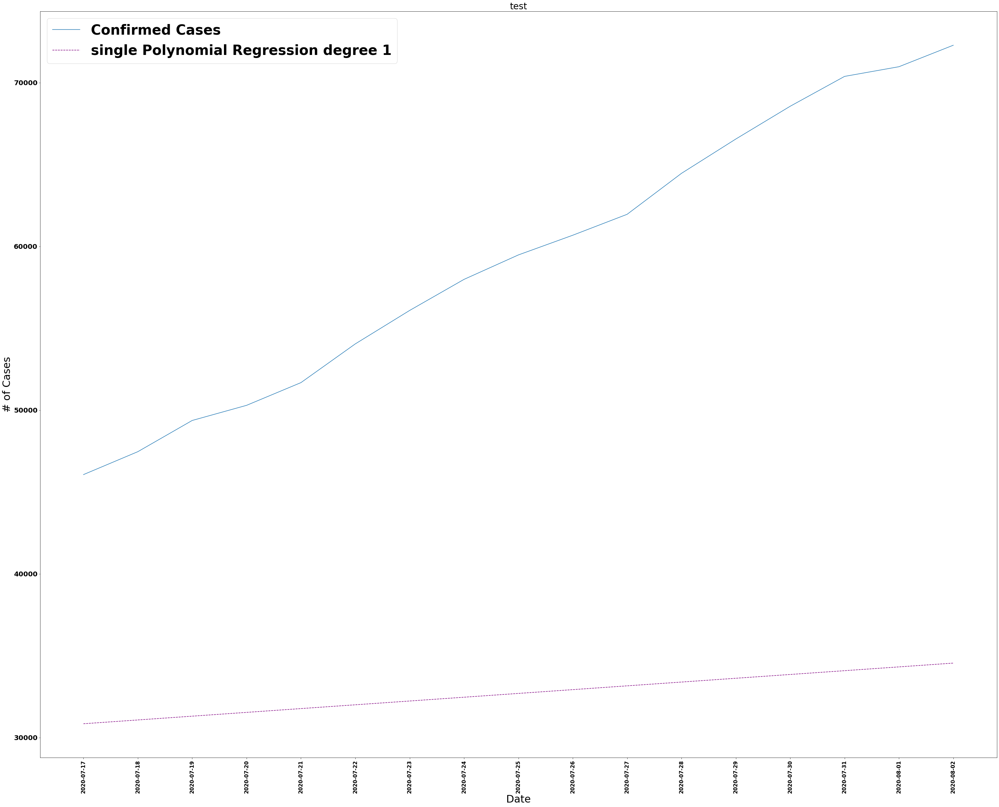

In [ ]:
Israel_poly,dataset = fit_and_test_poly('single Polynomial Regression degree 1',loc="Israel",degree=1,forecast=data)

RMSE: 3245.770454775925
 MSE: 10535025.845096314
 MAE: 2659.914486042961
, MAPE:35.532953847495506



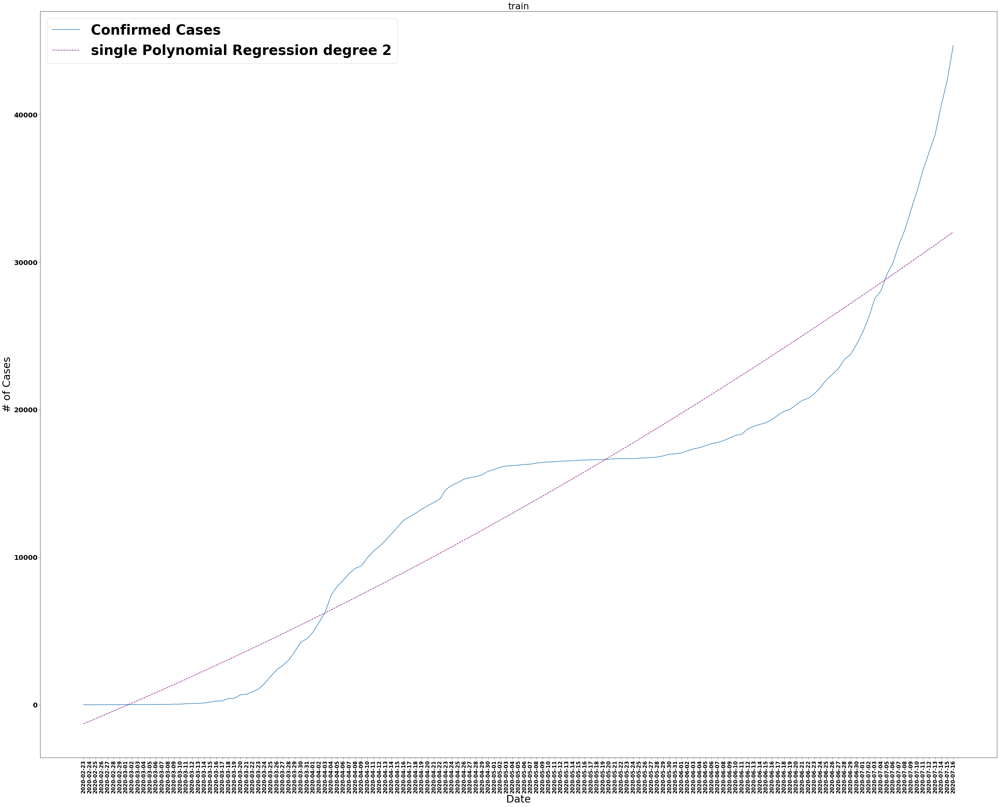

RMSE: 25547.47151967591
 MSE: 652673301.0486518
 MAE: 24592.519144296904
, MAPE:70.12120946131878



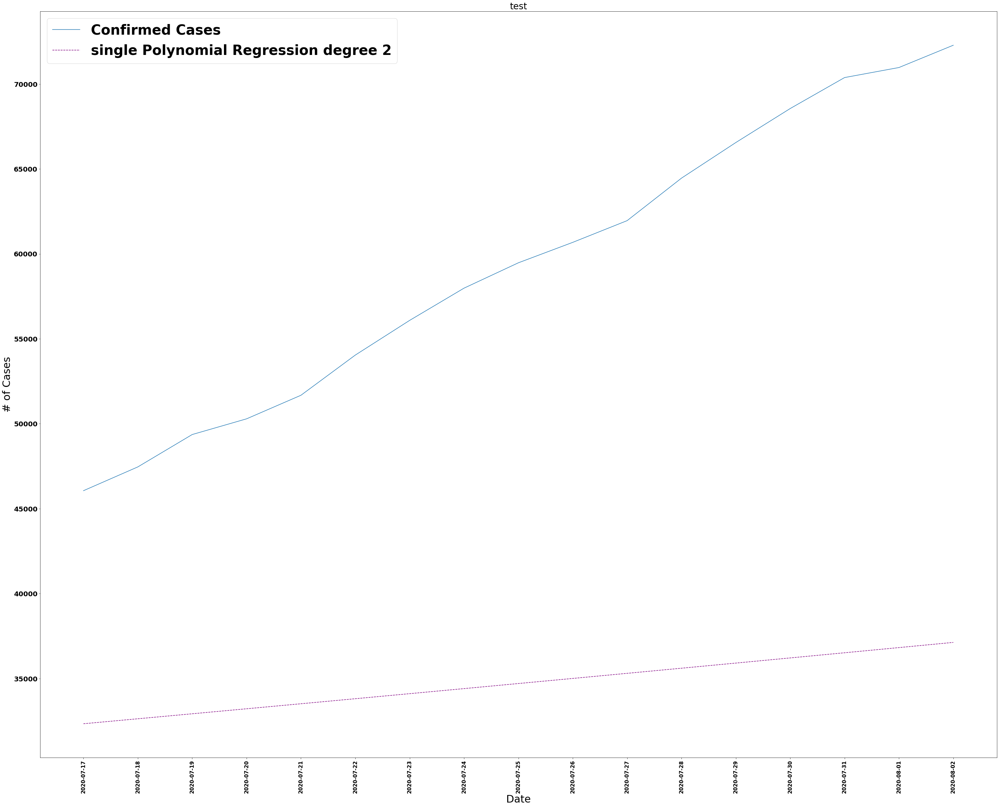

In [ ]:
Israel_poly2,israel_dataset = fit_and_test_poly('single Polynomial Regression degree 2',loc="Israel",degree=2,forecast=data) 

RMSE: 2745.693149303773
 MSE: 7538830.870133673
 MAE: 2342.7735334377558
, MAPE:31.768116569982546



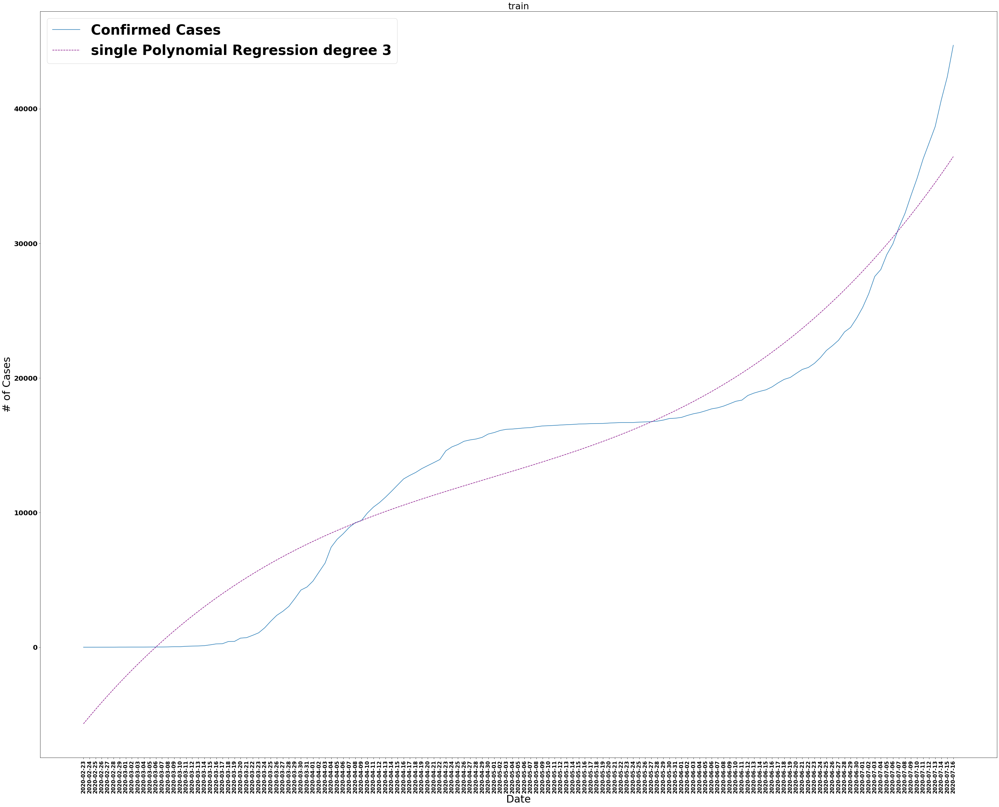

RMSE: 16735.678392866685
 MSE: 280082931.2694648
 MAE: 16121.824966651158
, MAPE:36.69361506373167



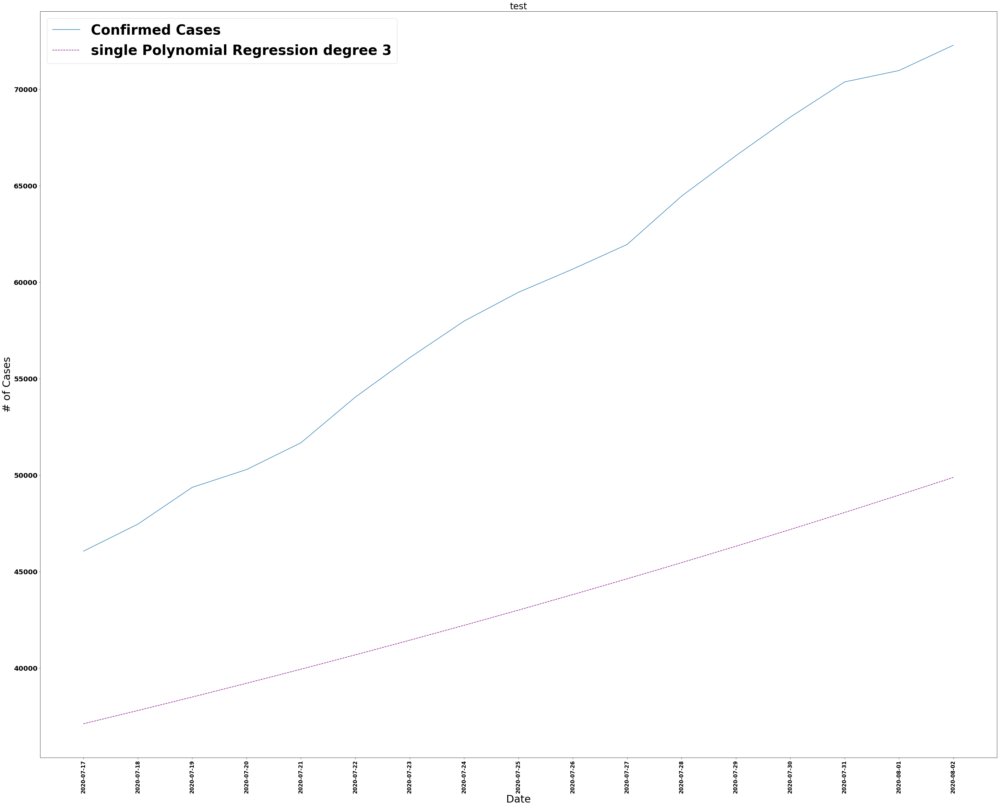

In [ ]:
Israel_poly3,israel_dataset = fit_and_test_poly('single Polynomial Regression degree 3',loc="Israel",degree=3,forecast=data) 

RMSE: 637.1252104325824
 MSE: 405928.5337687624
 MAE: 531.061435837017
, MAPE:23.581921502381505



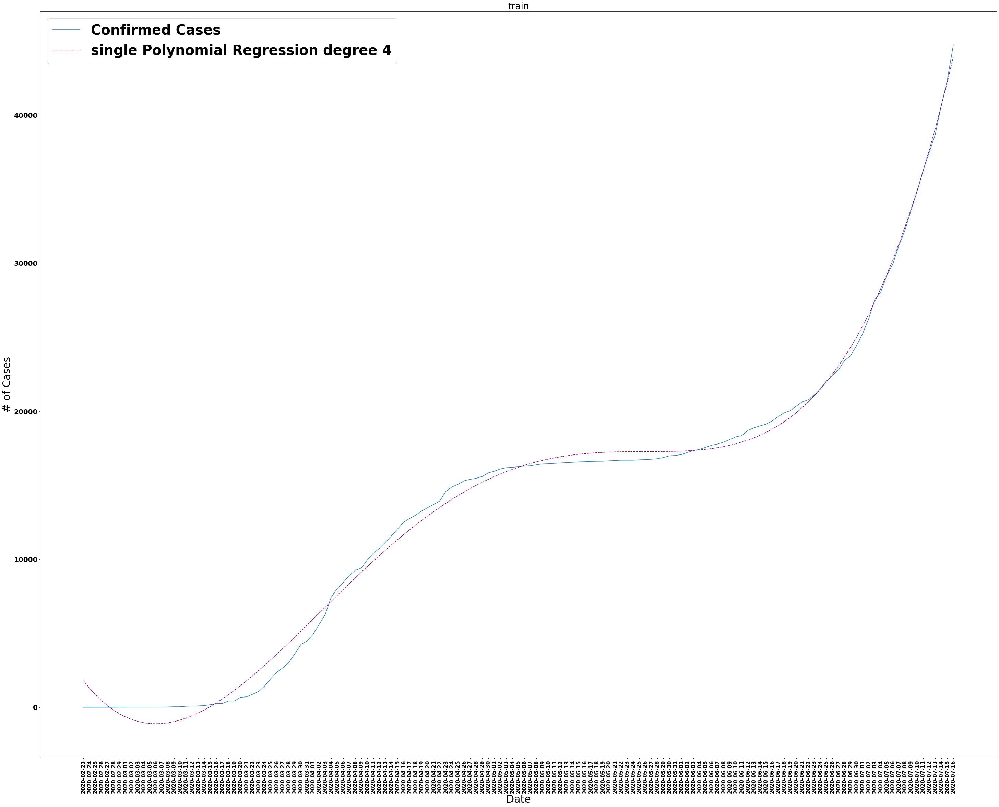

RMSE: 6766.474675762298
 MSE: 45785179.53773249
 MAE: 5121.514017246042
, MAPE:6.956827145443937



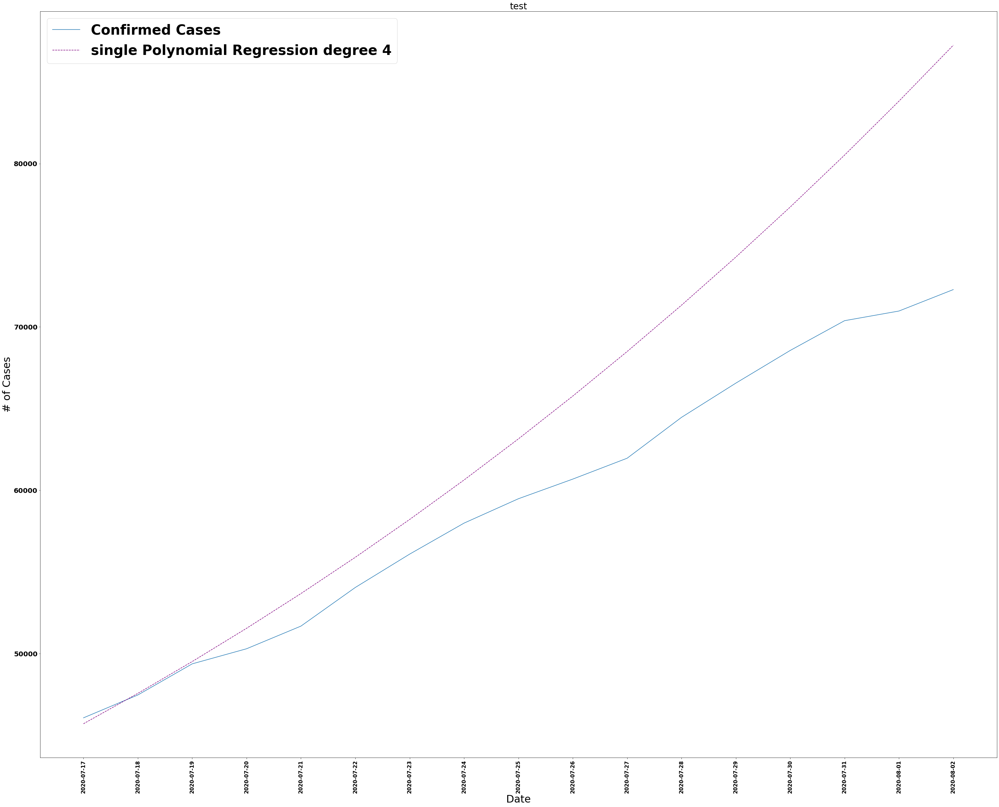

In [ ]:
Israel_poly4,israel_dataset = fit_and_test_poly('single Polynomial Regression degree 4',loc="Israel",degree=4,forecast=data) 

RMSE: 637.1161187872137
 MSE: 405916.9488184831
 MAE: 531.4226172645836
, MAPE:23.471516227669227



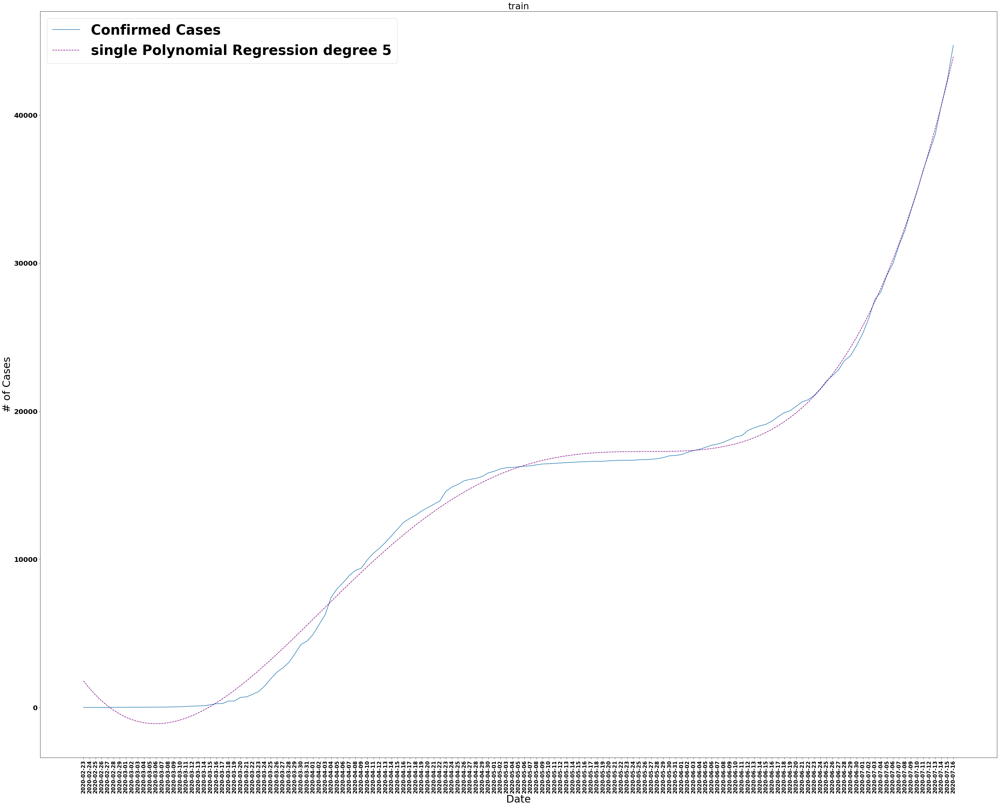

RMSE: 6815.967866454977
 MSE: 46457417.95654682
 MAE: 5164.943573118049
, MAPE:7.012897169110372



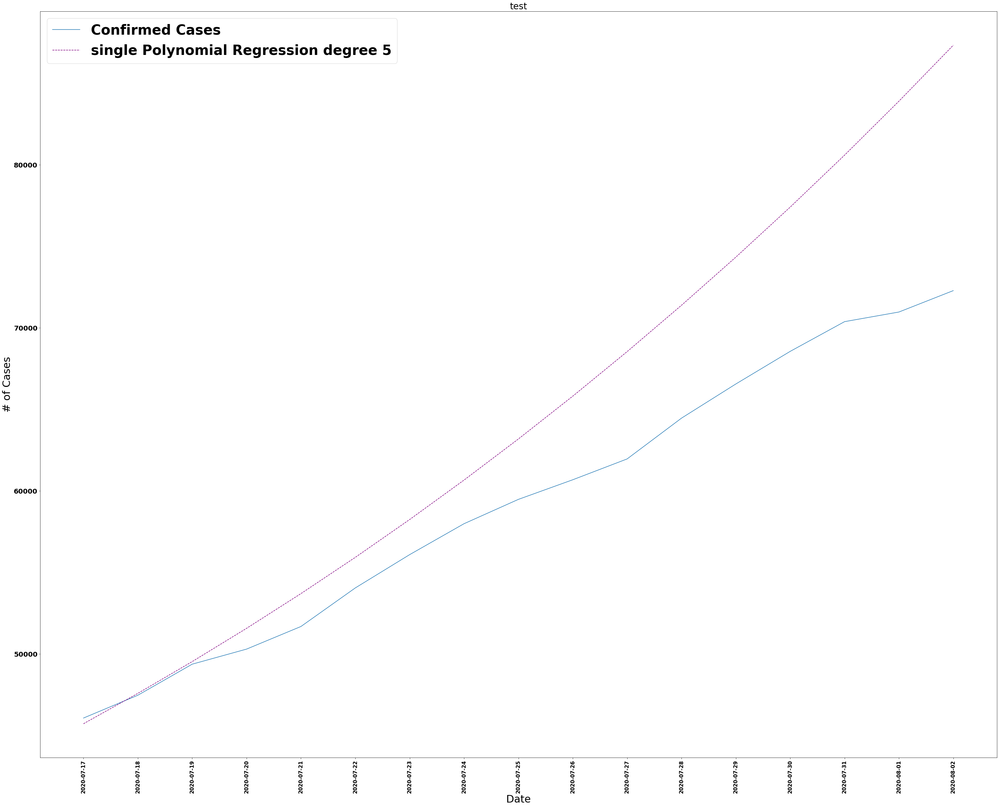

In [ ]:
Israel_poly5,israel_dataset = fit_and_test_poly('single Polynomial Regression degree 5',loc="Israel",degree=5,forecast=data) 

## DL approach.
we are trying two approacths:
1. lstm for global dependencies.
2. cnn on top oof lstm foroo global and local dependencies

In [ ]:
def read_data_for_ts(loc="World",cutoff='2020-02-22',split=0.9):
    data = pd.read_csv("https://covid.ourworldindata.org/data/owid-covid-data.csv")
    data = data[data.location==loc].ffill()
    data=data[data.date>cutoff].reset_index(drop=True)
    data = data[["date","total_cases"]]
    data.columns = ['date', 'x']
    data.date = pd.to_datetime(data.date,infer_datetime_format=True)
    data=data.set_index('date')
    train_size = int(len(data) * 0.9)
    return data[:train_size], data[train_size:]
def create_windows(x, y, time_steps):
    x_set, y_set = [], []
    for i in range(len(x) - time_steps):
        v = x[i:(i + time_steps)].to_numpy()
        x_set.append(v)        
        y_set.append(y[i + time_steps])
    return np.array(x_set), np.array(y_set)
def plot(y_test, test_pred, estimator_name,title):
    metrics(y_test, test_pred)
    plt.figure(figsize=(50, 40))
    plt.plot(np.arange(len(y_test), len(y_test) + len(test_pred)), y_test, marker='.', label="Confirmed cases")
    plt.plot(np.arange(len(y_test), len(y_test) + len(test_pred)), y_pred, linestyle='dashed', color="purple", label=estimator_name)
    plt.title(title)
    plt.xlabel('time Steps', size=30)
def prep(loc="World",cutoff='2020-02-22',split=0.9,time_steps=7):
    train,test = read_data_for_ts(loc=loc,cutoff=cutoff,split=split)
    x_train, y_train = create_windows(train, train.x, time_steps)
    x_test, y_test = create_windows(test, test.x, time_steps)
    return x_train, y_train, x_test, y_test

def fit_lstm(name,time_steps=7,units=64):
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(units,activation="relu"),input_shape=(time_steps,1)))
    model.add(tf.keras.layers.Dense(1))
    model.compile(loss="mse",
                  optimizer=tf.keras.optimizers.Adam(0.001))
    model.summary()
    history = model.fit(
        x_train, y_train, 
        epochs=1000, 
        batch_size=16,
        validation_data=(x_test,y_test), 
        verbose=0, 
        shuffle=False,
        callbacks=[tf.keras.callbacks.ModelCheckpoint(
        name, monitor='val_loss', verbose=0, save_best_only=True,
        save_weights_only=False, mode='auto', save_freq='epoch')]
    )

 
def fit_cnn(name,time_steps=7,units=64,filters=64,kernel_size=4):
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Conv1D(filters=filters, kernel_size=kernel_size, activation='relu', input_shape=(time_steps,1)))
    model.add(tf.keras.layers.MaxPooling1D())
    model.add(tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(units,activation="relu")))

    model.add(tf.keras.layers.Dense(1))
    model.compile(loss='mse', optimizer=tf.keras.optimizers.Adam())
    model.summary()
    history = model.fit(
        x_train, y_train, 
        epochs=1000, 
        batch_size=16,
        validation_data=(x_test,y_test), 
        verbose=0, 
        shuffle=False,
        callbacks=[tf.keras.callbacks.ModelCheckpoint(
        name, monitor='val_loss', verbose=0, save_best_only=True,
        save_weights_only=False, mode='auto', save_freq='epoch')]
    )

## World ##

Model: "sequential_20"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
bidirectional_20 (Bidirectio (None, 128)               33792     
_________________________________________________________________
dense_20 (Dense)             (None, 1)                 129       
Total params: 33,921
Trainable params: 33,921
Non-trainable params: 0
_________________________________________________________________
RMSE: 65238.68791117681
 MSE: 4256086400.371927
 MAE: 52317.46236795775
, MAPE:794.7756166269571

RMSE: 44378.952707658296
 MSE: 1969491443.4285715
 MAE: 37315.28571428572
, MAPE:7.528552698231927



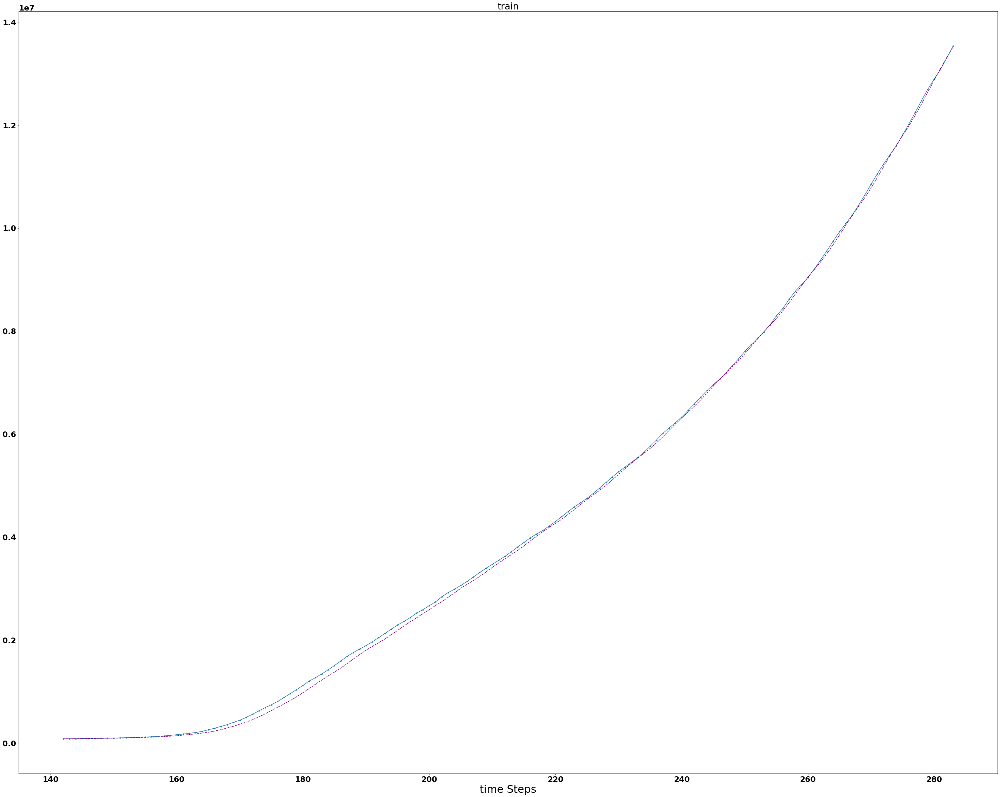

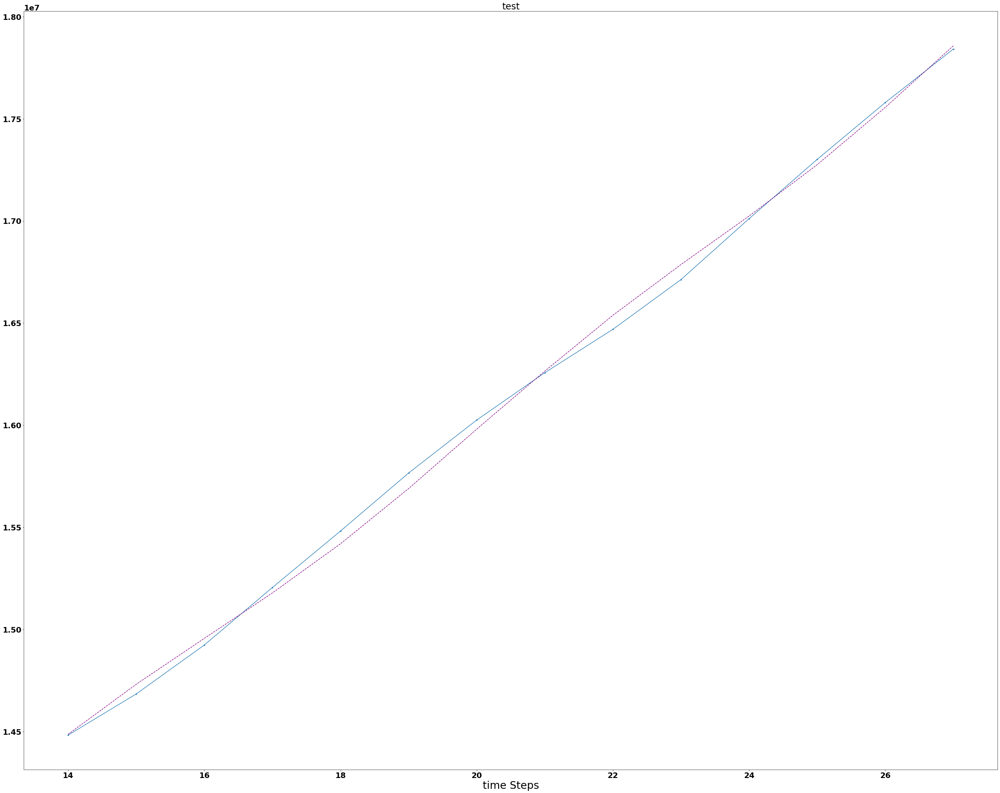

In [ ]:
time_steps = 3
name="lstm3.h5"
x_train, y_train, x_test, y_test = prep(time_steps=time_steps)
x_train.shape
fit_lstm(name=name,time_steps=time_steps)
model = tf.keras.models.load_model(name)
y_pred = model.predict(x_train)
plot(y_test=y_train,test_pred=y_pred,estimator_name=name,title="train")
y_pred = model.predict(x_test)
plot(y_test,y_pred,estimator_name=name,title="test")

Model: "sequential_21"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
bidirectional_21 (Bidirectio (None, 128)               33792     
_________________________________________________________________
dense_21 (Dense)             (None, 1)                 129       
Total params: 33,921
Trainable params: 33,921
Non-trainable params: 0
_________________________________________________________________
RMSE: 77668.67625298143
 MSE: 6032423270.890442
 MAE: 62872.988671875
, MAPE:736.9792006396582

RMSE: 40037.46003432286
 MSE: 1602998206.0
 MAE: 32533.0
, MAPE:6.418514681976838



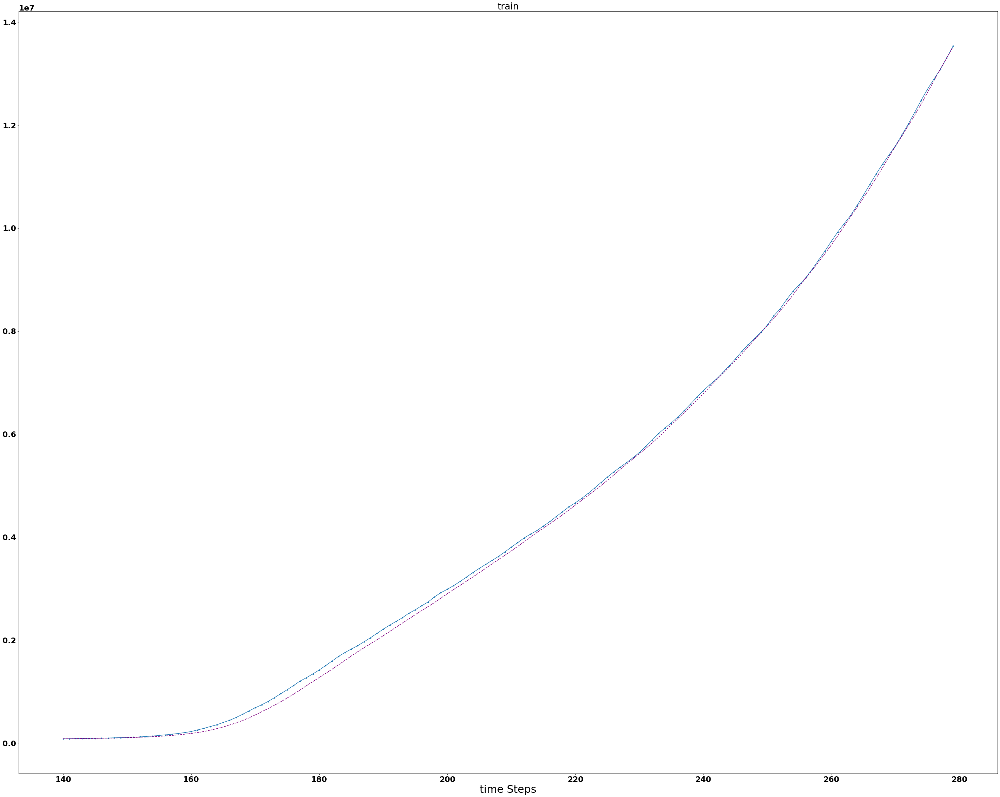

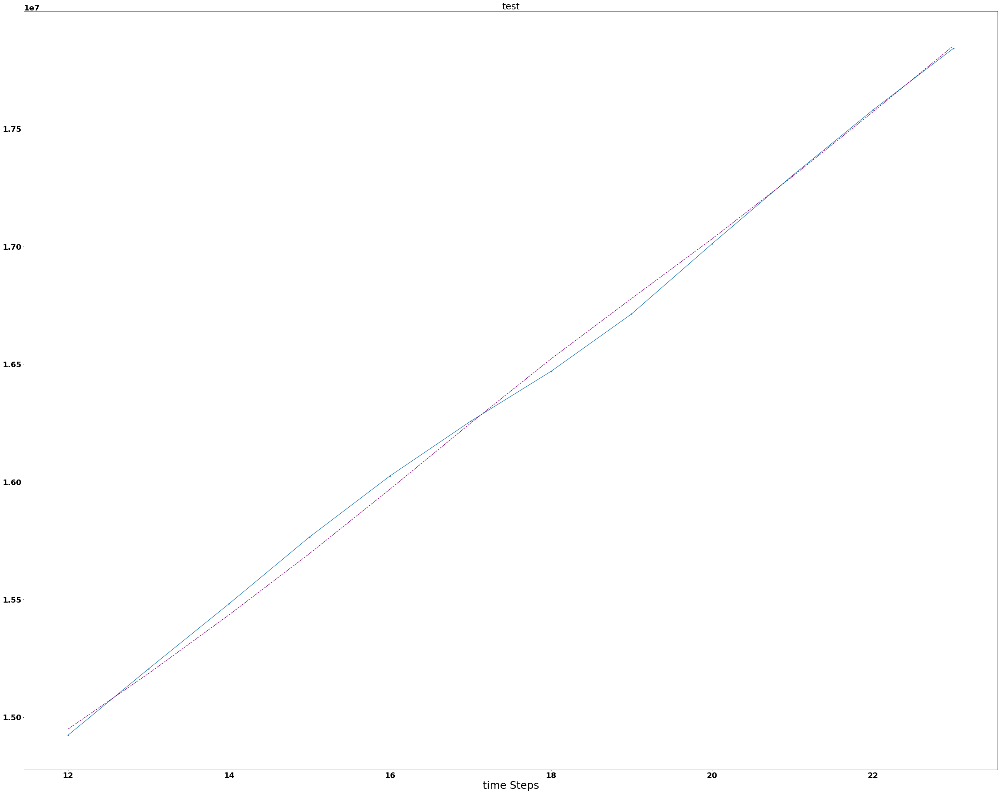

In [ ]:
time_steps = 5
name="lstm5.h5"
x_train, y_train, x_test, y_test = prep(time_steps=time_steps)
x_train.shape
fit_lstm(name=name,time_steps=time_steps)
model = tf.keras.models.load_model(name)
y_pred = model.predict(x_train)
plot(y_test=y_train,test_pred=y_pred,estimator_name=name,title="train")
y_pred = model.predict(x_test)
plot(y_test,y_pred,estimator_name=name,title="test")

Model: "sequential_22"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
bidirectional_22 (Bidirectio (None, 128)               33792     
_________________________________________________________________
dense_22 (Dense)             (None, 1)                 129       
Total params: 33,921
Trainable params: 33,921
Non-trainable params: 0
_________________________________________________________________
RMSE: 123825.01410410267
 MSE: 15332634117.881224
 MAE: 101496.41638360507
, MAPE:675.0066280074564

RMSE: 42161.816714890265
 MSE: 1777618788.7
 MAE: 38976.7
, MAPE:5.2905326738395715



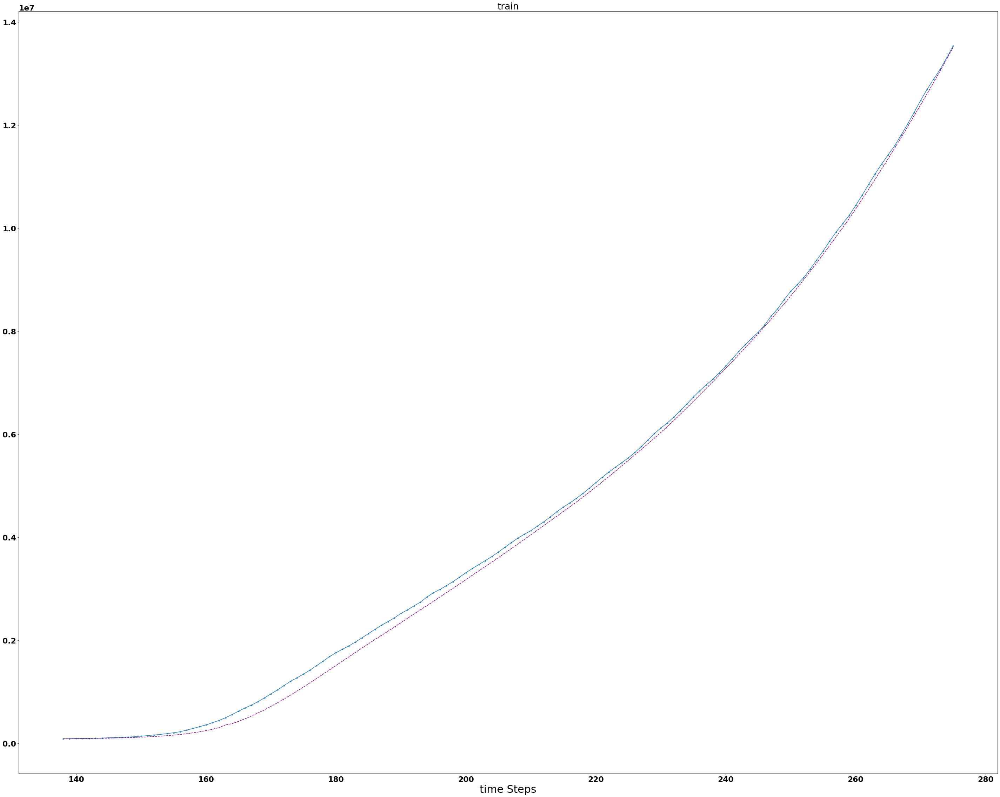

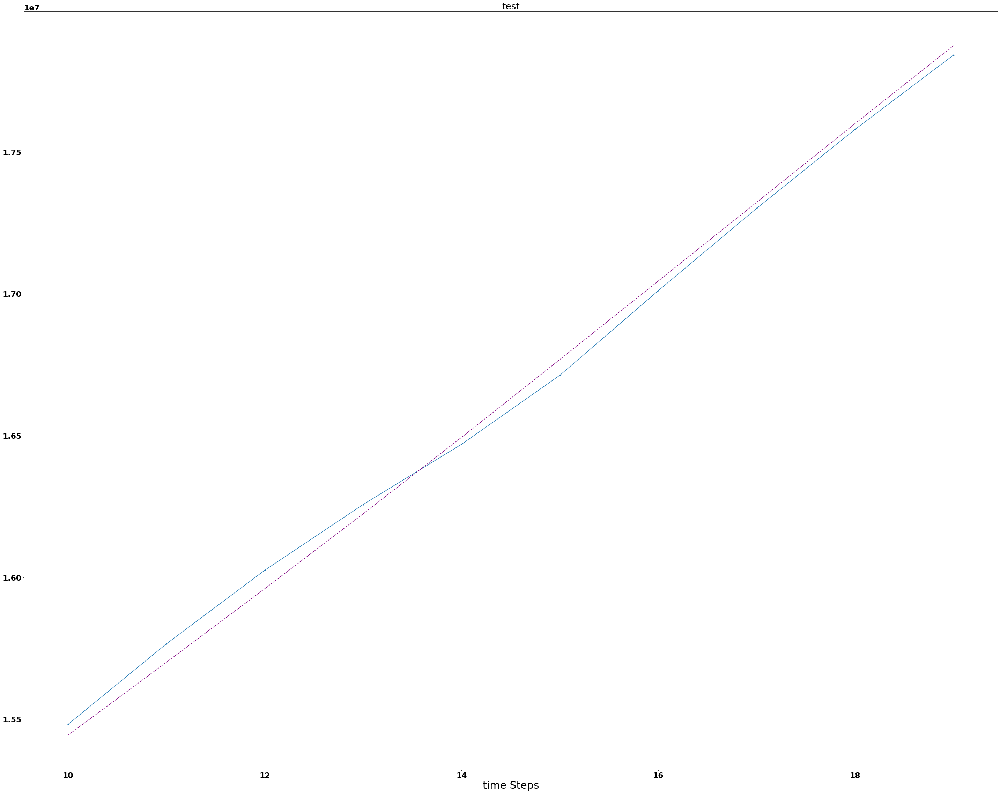

In [ ]:
time_steps = 7
name="lstm7.h5"
x_train, y_train, x_test, y_test = prep(time_steps=time_steps)
x_train.shape
fit_lstm(name=name,time_steps=time_steps)
model = tf.keras.models.load_model(name)
y_pred = model.predict(x_train)
plot(y_test=y_train,test_pred=y_pred,estimator_name=name,title="train")
y_pred = model.predict(x_test)
plot(y_test,y_pred,estimator_name=name,title="test")

Model: "sequential_23"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_8 (Conv1D)            (None, 2, 64)             320       
_________________________________________________________________
max_pooling1d_8 (MaxPooling1 (None, 1, 64)             0         
_________________________________________________________________
bidirectional_23 (Bidirectio (None, 128)               66048     
_________________________________________________________________
dense_23 (Dense)             (None, 1)                 129       
Total params: 66,497
Trainable params: 66,497
Non-trainable params: 0
_________________________________________________________________
RMSE: 71350.7453566032
 MSE: 5090928862.942835
 MAE: 56845.44034598214
, MAPE:737.9559060481034

RMSE: 44244.278623531274
 MSE: 1957556190.9166667
 MAE: 36316.583333333336
, MAPE:6.417424796977861



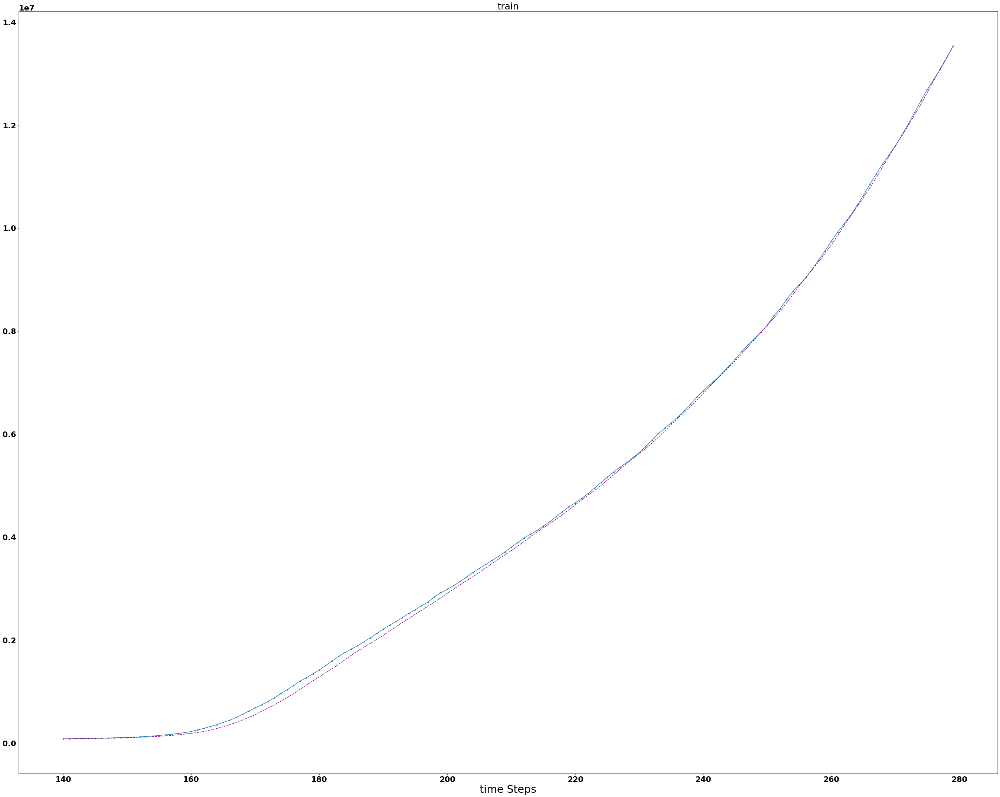

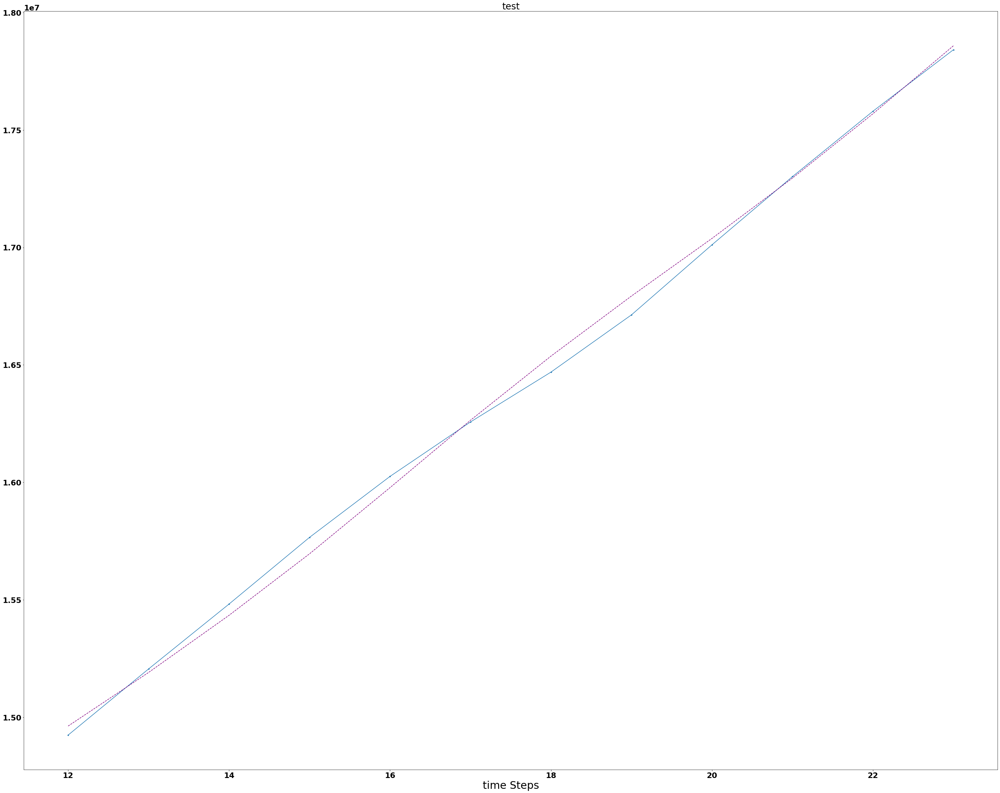

In [ ]:
time_steps = 5
name="cnnlstm5.h5"
x_train, y_train, x_test, y_test = prep(time_steps=time_steps)
x_train.shape
fit_cnn(name=name,time_steps=time_steps)
model = tf.keras.models.load_model(name)
y_pred = model.predict(x_train)
plot(y_test=y_train,test_pred=y_pred,estimator_name=name,title="train")
y_pred = model.predict(x_test)
plot(y_test,y_pred,estimator_name=name,title="test")

Model: "sequential_24"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_9 (Conv1D)            (None, 4, 64)             320       
_________________________________________________________________
max_pooling1d_9 (MaxPooling1 (None, 2, 64)             0         
_________________________________________________________________
bidirectional_24 (Bidirectio (None, 128)               66048     
_________________________________________________________________
dense_24 (Dense)             (None, 1)                 129       
Total params: 66,497
Trainable params: 66,497
Non-trainable params: 0
_________________________________________________________________
RMSE: 96901.76267360845
 MSE: 9389951609.252335
 MAE: 78424.75939764493
, MAPE:678.0243799036699

RMSE: 48139.181462712884
 MSE: 2317380791.9
 MAE: 40397.3
, MAPE:5.277435319442777



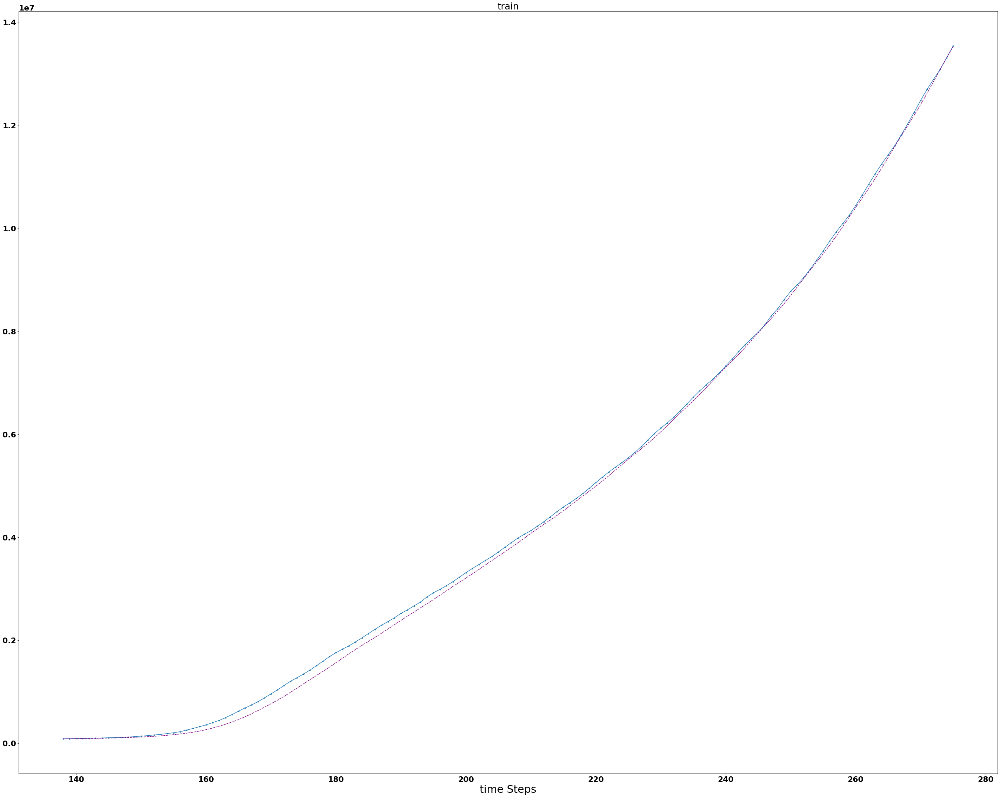

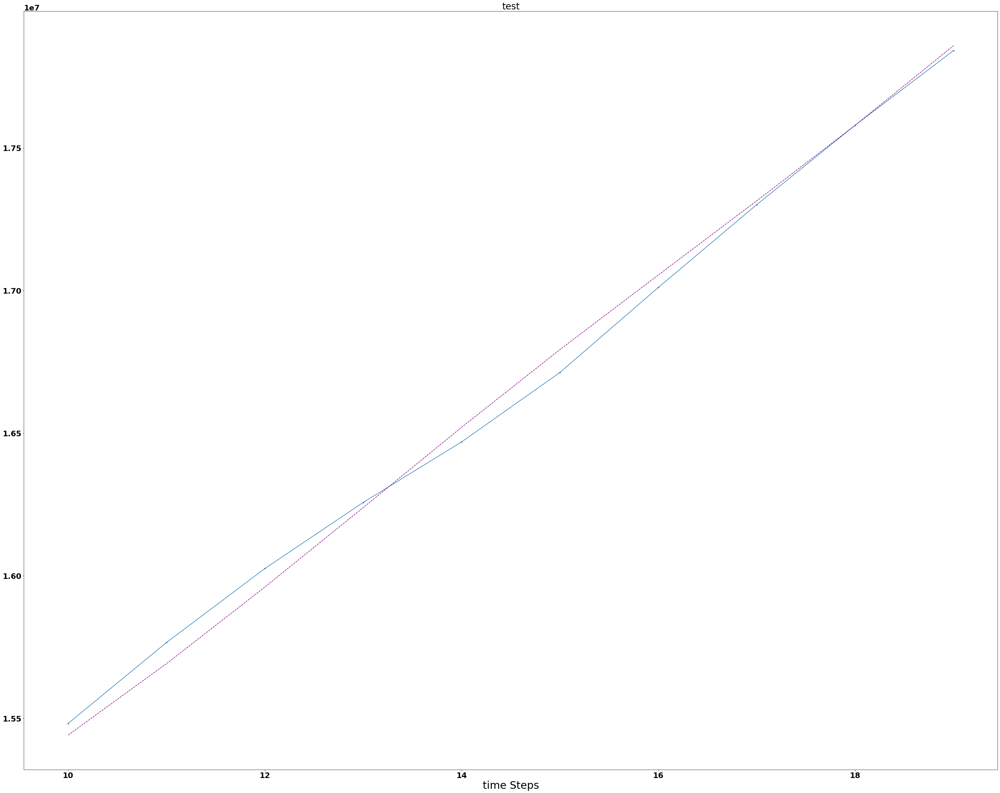

In [ ]:
time_steps = 7
name="cnnlstm7.h5"
x_train, y_train, x_test, y_test = prep(time_steps=time_steps)
x_train.shape
fit_cnn(name=name,time_steps=time_steps)
model = tf.keras.models.load_model(name)
y_pred = model.predict(x_train)
plot(y_test=y_train,test_pred=y_pred,estimator_name=name,title="train")
y_pred = model.predict(x_test)
plot(y_test,y_pred,estimator_name=name,title="test")

## israel

Model: "sequential_25"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
bidirectional_25 (Bidirectio (None, 128)               33792     
_________________________________________________________________
dense_25 (Dense)             (None, 1)                 129       
Total params: 33,921
Trainable params: 33,921
Non-trainable params: 0
_________________________________________________________________
RMSE: 451.0825289551376
 MSE: 203475.44792856256
 MAE: 355.4743109055808
, MAPE:22805.735408853725

RMSE: 657.7470385446517
 MSE: 432631.16671425954
 MAE: 544.451171875
, MAPE:13.538926190189512



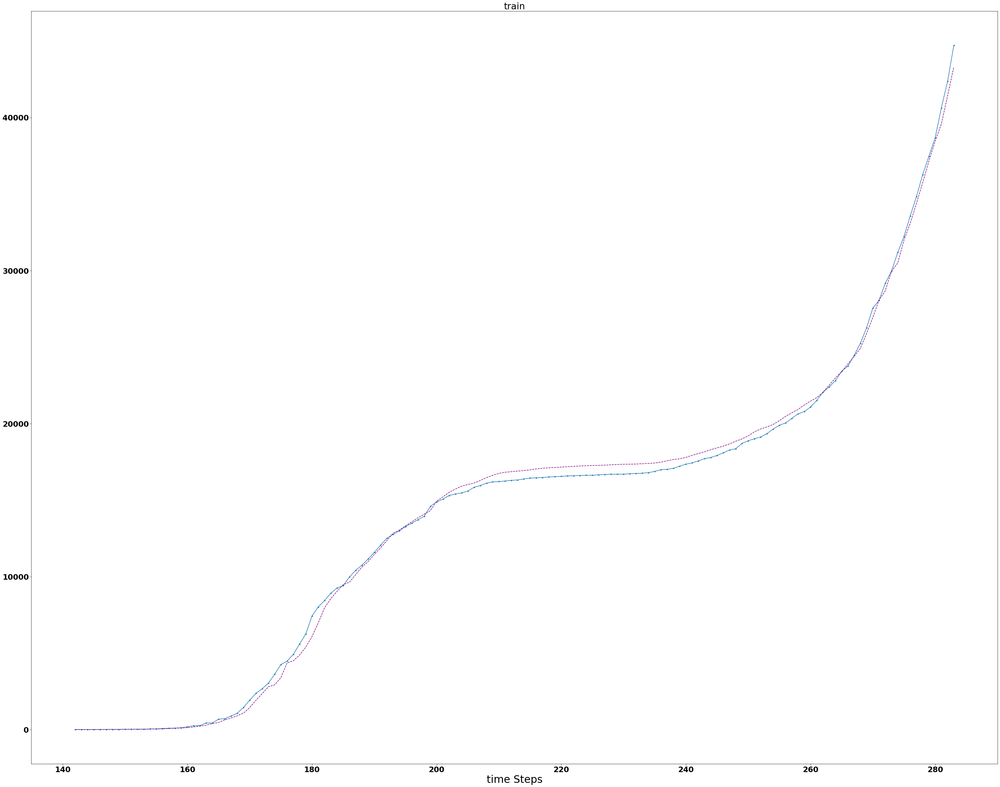

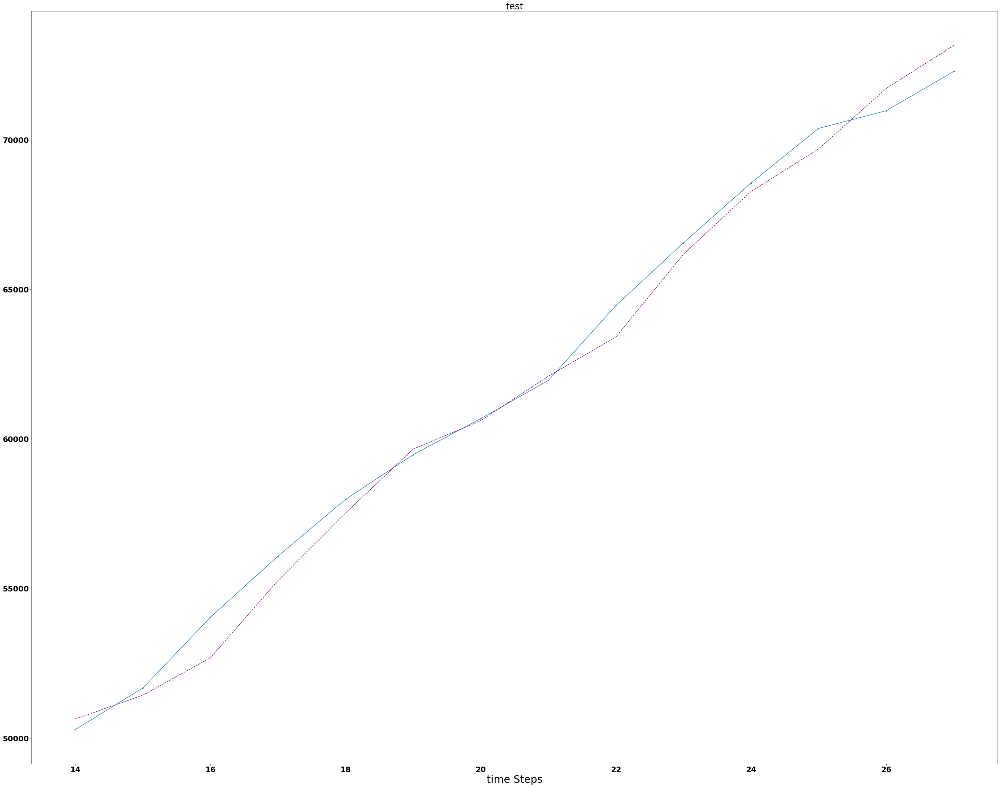

In [ ]:
time_steps = 3
name="Ilstm3.h5"
x_train, y_train, x_test, y_test = prep(loc="Israel",time_steps=time_steps)
x_train.shape
fit_lstm(name=name,time_steps=time_steps)
model = tf.keras.models.load_model(name)
y_pred = model.predict(x_train)
plot(y_test=y_train,test_pred=y_pred,estimator_name=name,title="train")
y_pred = model.predict(x_test)
plot(y_test,y_pred,estimator_name=name,title="test")

Model: "sequential_26"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
bidirectional_26 (Bidirectio (None, 128)               33792     
_________________________________________________________________
dense_26 (Dense)             (None, 1)                 129       
Total params: 33,921
Trainable params: 33,921
Non-trainable params: 0
_________________________________________________________________
RMSE: 520.4475411848076
 MSE: 270865.64312531205
 MAE: 413.1344805146967
, MAPE:13090.48086190685

RMSE: 800.5049543304862
 MSE: 640808.1819076538
 MAE: 673.6321614583334
, MAPE:11.191963867197357



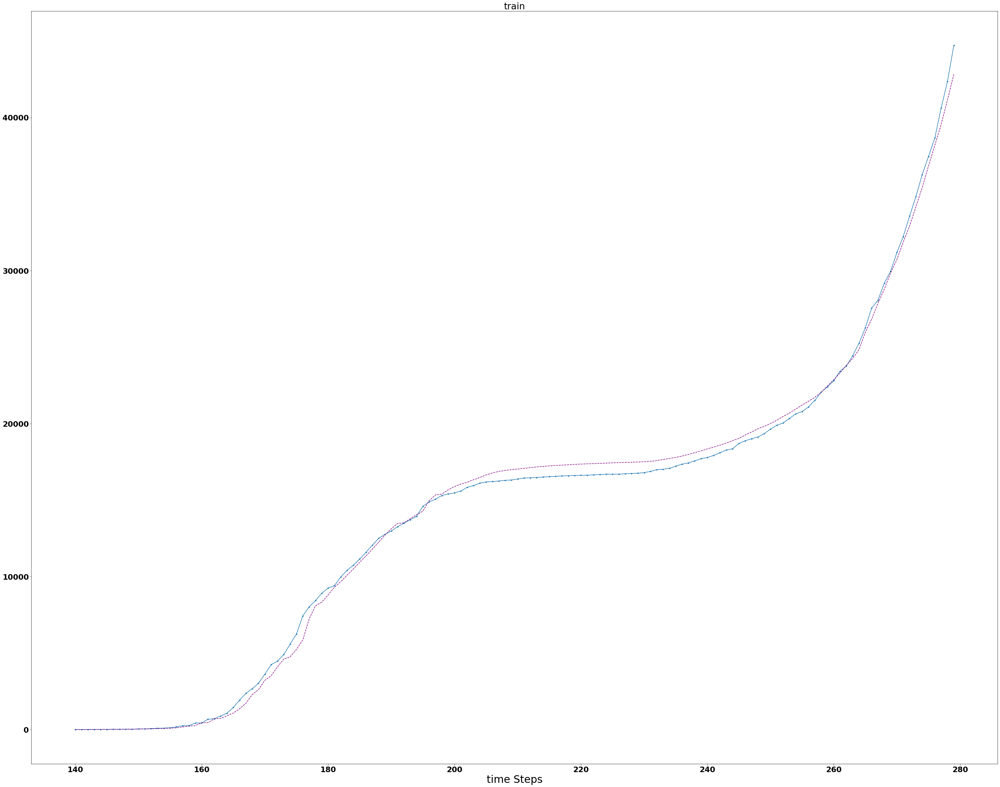

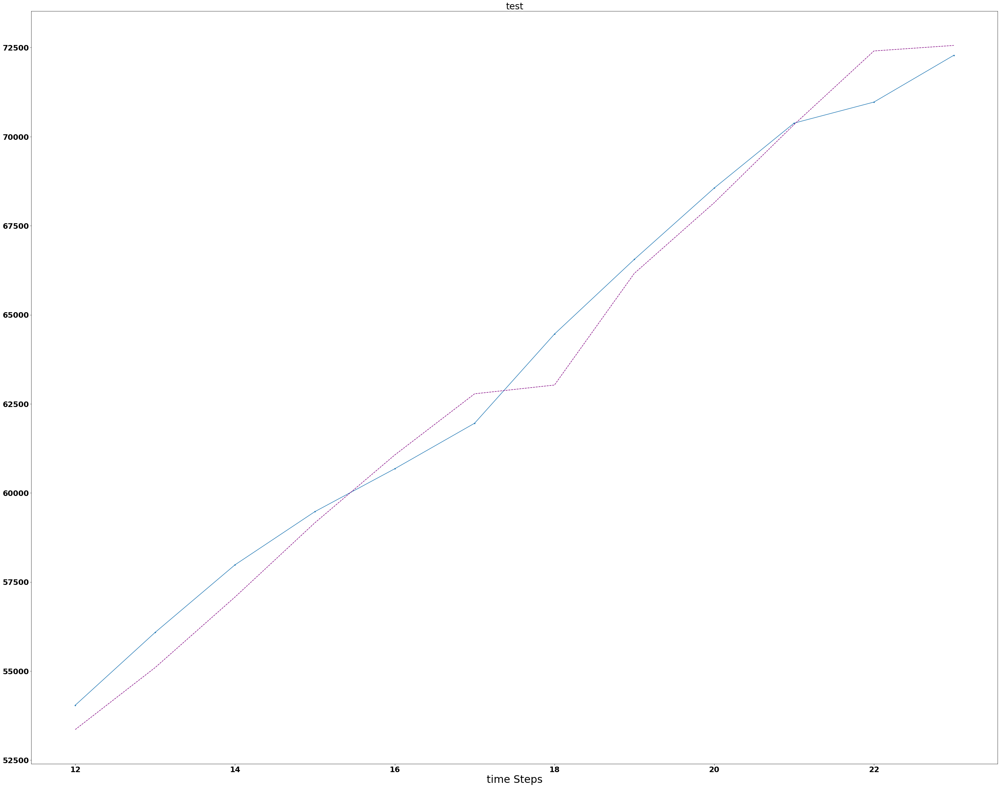

In [ ]:
time_steps = 5
name="Ilstm5.h5"
x_train, y_train, x_test, y_test = prep(loc="Israel",time_steps=time_steps)
x_train.shape
fit_lstm(name=name,time_steps=time_steps)
model = tf.keras.models.load_model(name)
y_pred = model.predict(x_train)
plot(y_test=y_train,test_pred=y_pred,estimator_name=name,title="train")
y_pred = model.predict(x_test)
plot(y_test,y_pred,estimator_name=name,title="test")

Model: "sequential_27"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
bidirectional_27 (Bidirectio (None, 128)               33792     
_________________________________________________________________
dense_27 (Dense)             (None, 1)                 129       
Total params: 33,921
Trainable params: 33,921
Non-trainable params: 0
_________________________________________________________________
RMSE: 650.10804687076
 MSE: 422640.4726061143
 MAE: 531.2241489161615
, MAPE:8476.916954694356

RMSE: 660.1159887443163
 MSE: 435753.1185958862
 MAE: 552.316796875
, MAPE:8.921712304858694



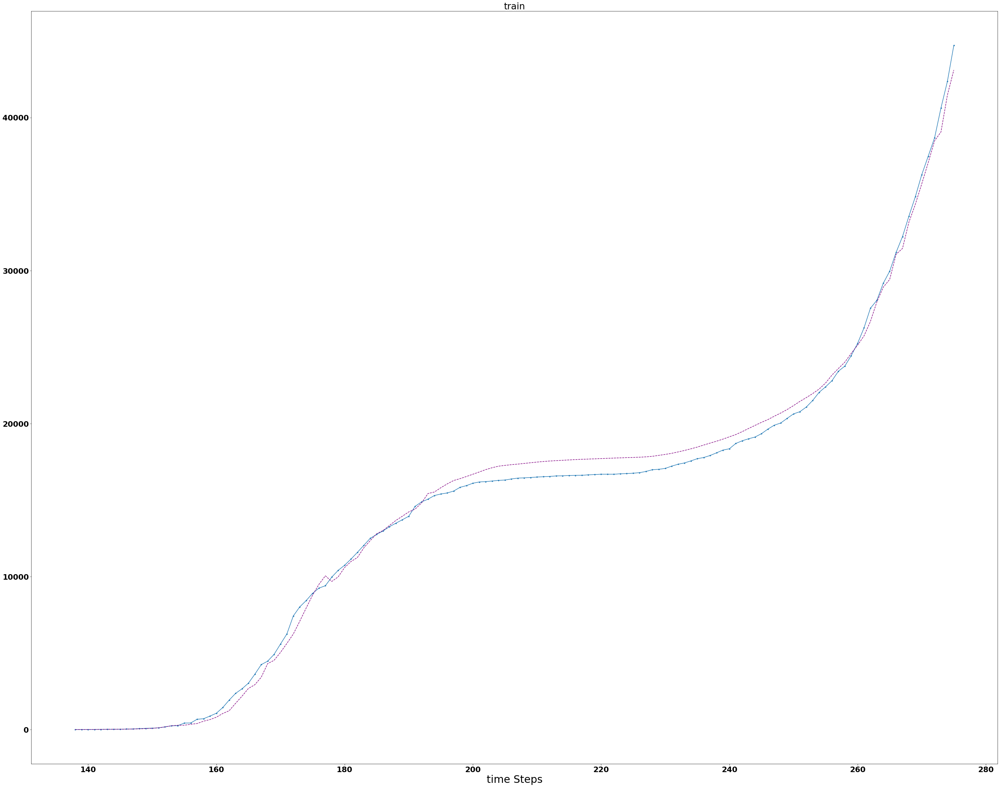

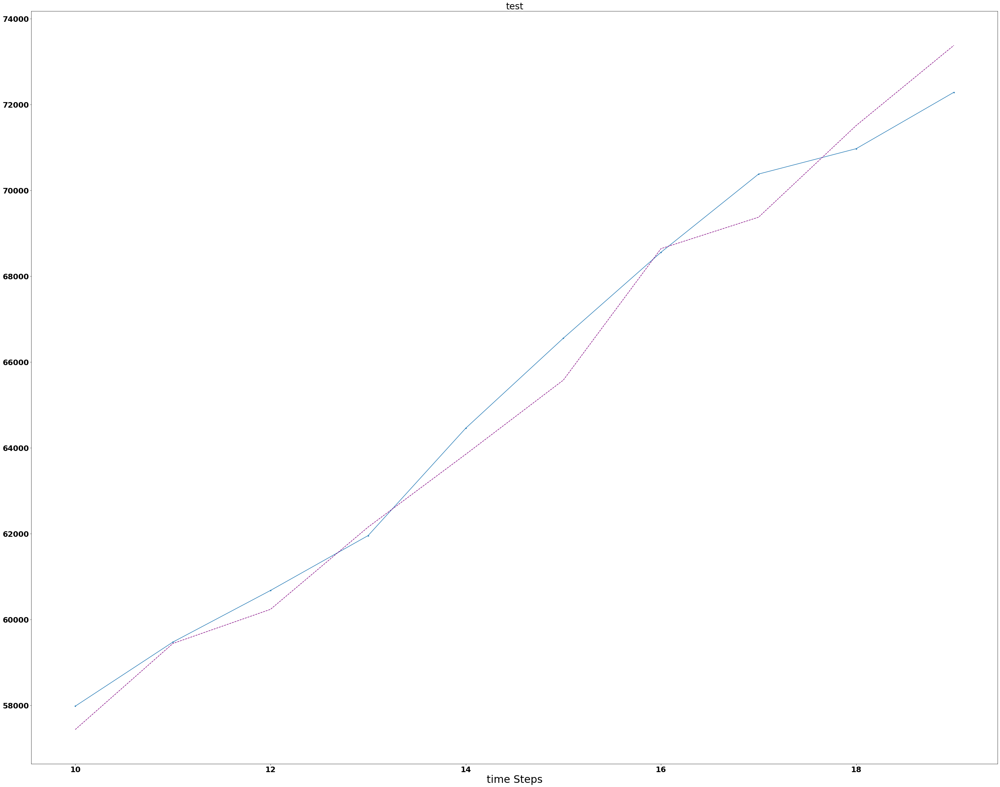

In [ ]:
time_steps = 7
name="Ilstm7.h5"
x_train, y_train, x_test, y_test = prep(loc="Israel",time_steps=time_steps)
x_train.shape
fit_lstm(name=name,time_steps=time_steps)
model = tf.keras.models.load_model(name)
y_pred = model.predict(x_train)
plot(y_test=y_train,test_pred=y_pred,estimator_name=name,title="train")
y_pred = model.predict(x_test)
plot(y_test,y_pred,estimator_name=name,title="test")

Model: "sequential_28"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_10 (Conv1D)           (None, 2, 64)             320       
_________________________________________________________________
max_pooling1d_10 (MaxPooling (None, 1, 64)             0         
_________________________________________________________________
bidirectional_28 (Bidirectio (None, 128)               66048     
_________________________________________________________________
dense_28 (Dense)             (None, 1)                 129       
Total params: 66,497
Trainable params: 66,497
Non-trainable params: 0
_________________________________________________________________
RMSE: 317.3026728416451
 MSE: 100680.98619245208
 MAE: 251.34066881494863
, MAPE:13100.747761132729

RMSE: 795.6302421323213
 MSE: 633027.4821955363
 MAE: 703.9264322916666
, MAPE:11.289240766141484



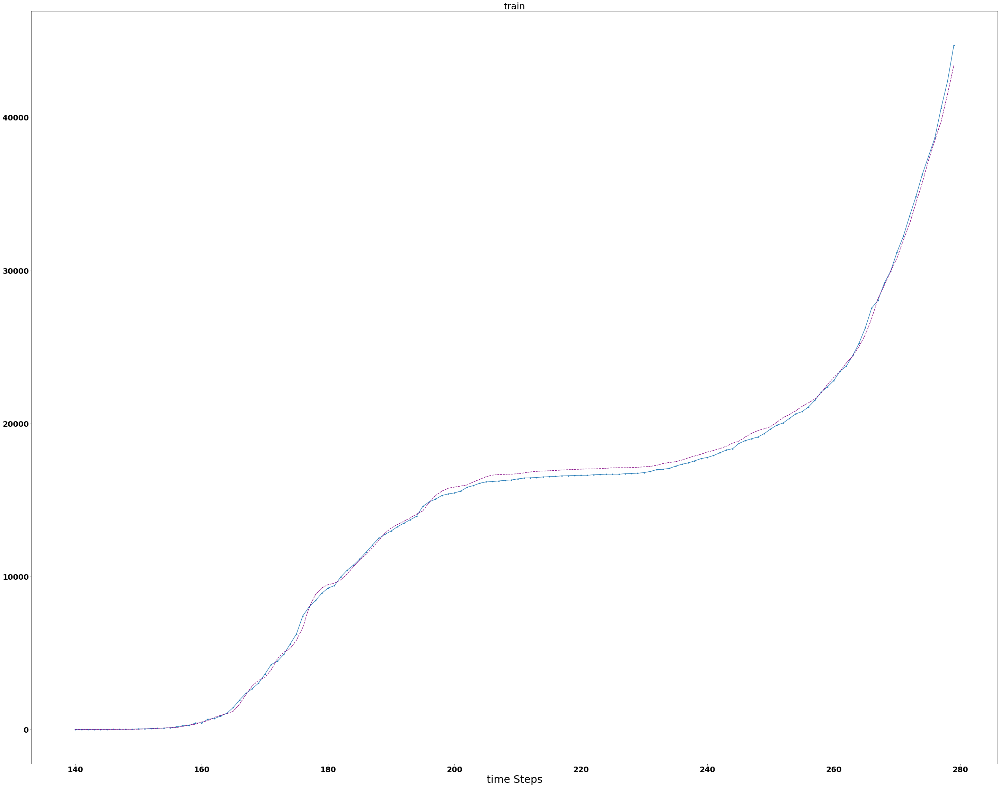

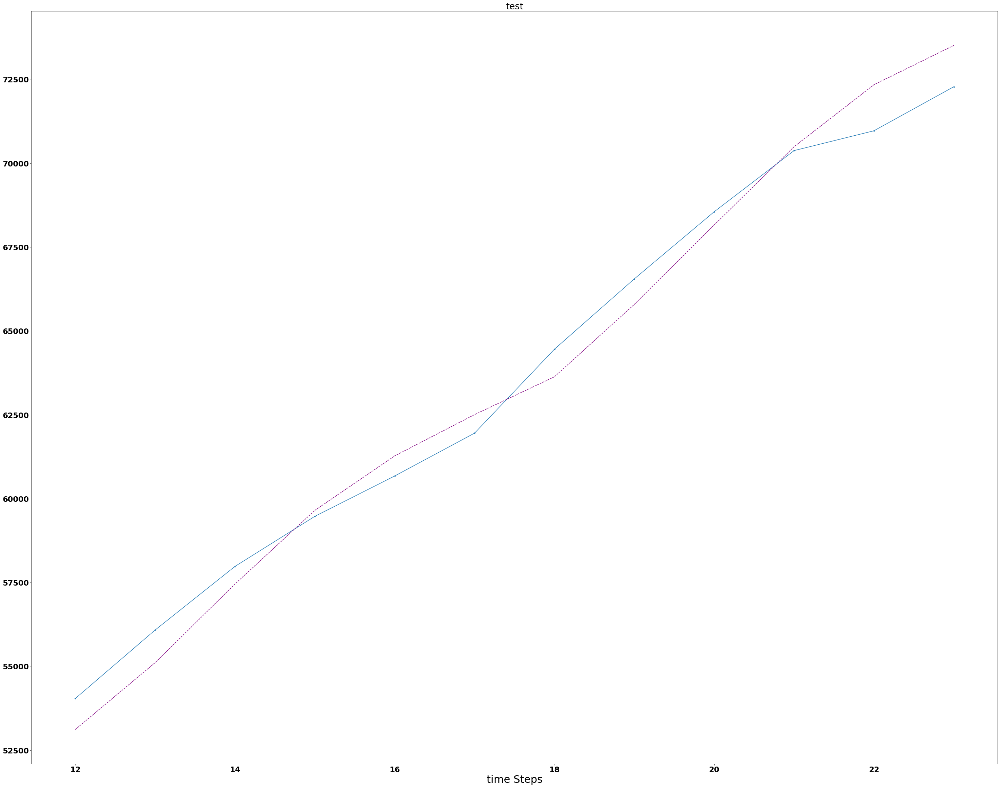

In [ ]:
time_steps = 5
name="Icnnlstm5.h5"
x_train, y_train, x_test, y_test = prep(loc="Israel",time_steps=time_steps)
x_train.shape
fit_cnn(name=name,time_steps=time_steps)
model = tf.keras.models.load_model(name)
y_pred = model.predict(x_train)
plot(y_test=y_train,test_pred=y_pred,estimator_name=name,title="train")
y_pred = model.predict(x_test)
plot(y_test,y_pred,estimator_name=name,title="test")

Model: "sequential_29"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_11 (Conv1D)           (None, 4, 64)             320       
_________________________________________________________________
max_pooling1d_11 (MaxPooling (None, 2, 64)             0         
_________________________________________________________________
bidirectional_29 (Bidirectio (None, 128)               66048     
_________________________________________________________________
dense_29 (Dense)             (None, 1)                 129       
Total params: 66,497
Trainable params: 66,497
Non-trainable params: 0
_________________________________________________________________
RMSE: 730.2869480914118
 MSE: 533319.0265526683
 MAE: 584.6374169829963
, MAPE:8524.88697248104

RMSE: 864.5105741270055
 MSE: 747378.5327774048
 MAE: 746.783203125
, MAPE:9.206137565349806



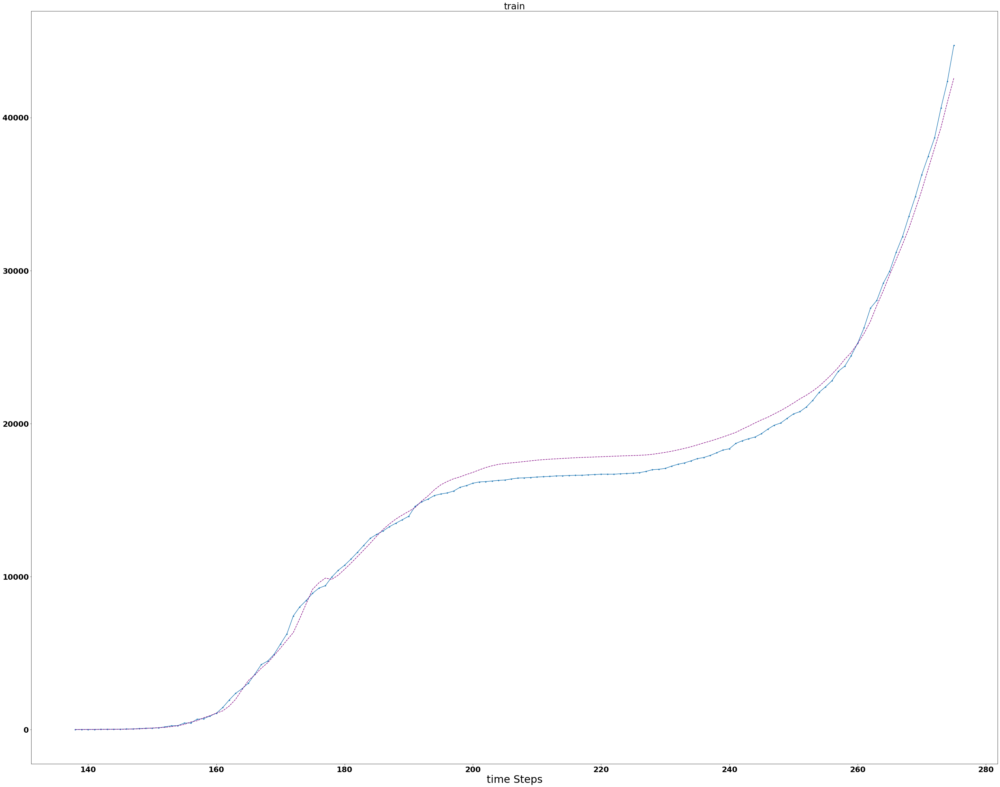

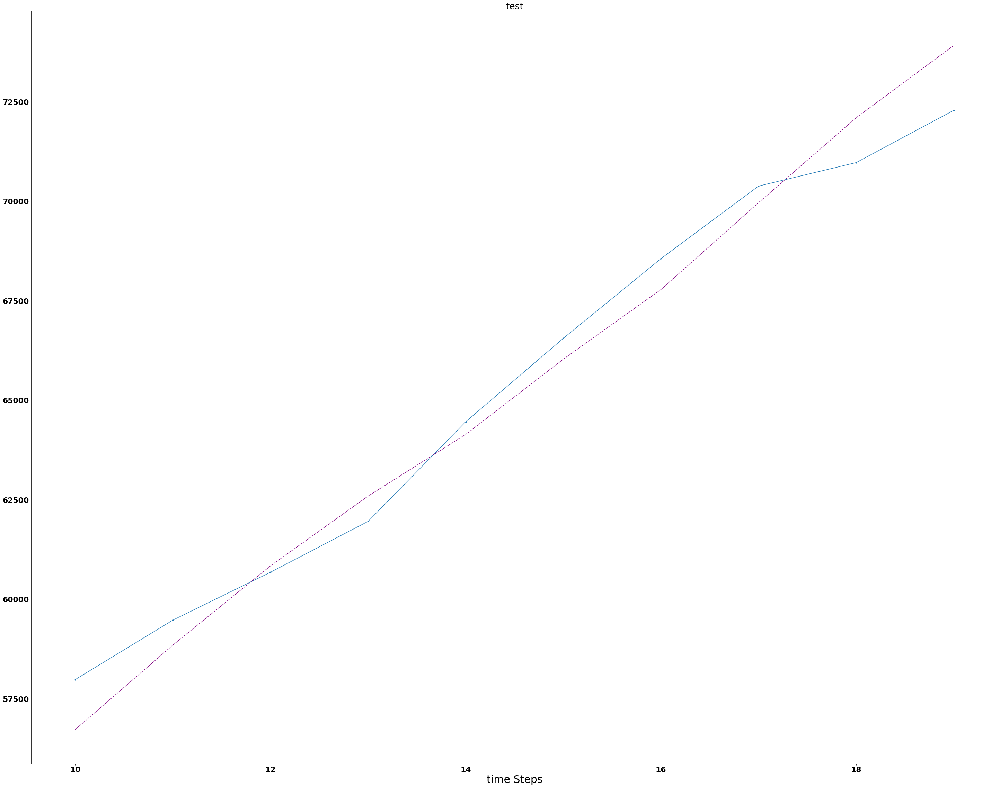

In [ ]:
time_steps = 7
name="Icnnlstm7.h5"
x_train, y_train, x_test, y_test = prep(loc="Israel",time_steps=time_steps)
x_train.shape
fit_cnn(name=name,time_steps=time_steps)
model = tf.keras.models.load_model(name)
y_pred = model.predict(x_train)
plot(y_test=y_train,test_pred=y_pred,estimator_name=name,title="train")
y_pred = model.predict(x_test)
plot(y_test,y_pred,estimator_name=name,title="test")